# SUBJECT DEPENDENT TESTING

## TRAINING DATA

In [ ]:
import numpy as np
def segment_data(train_data, train_labels=None, window_size=512, step_size=384):
    """
    Segment data into smaller chunks with a sliding window.

    Parameters:
    - data: np.array, input data of shape (samples, channels, time_steps, 1)
    - labels: np.array, input labels of shape (samples, num_classes)
    - window_size: int, the size of each segment (default 512)
    - step_size: int, the sliding window step size (default 384)

    Returns:
    - segmented_data: np.array, segmented data with shape (new_samples, channels, window_size, 1)
    - segmented_labels: np.array, corresponding labels for each segment
    """
    segmented_data = []
    segmented_labels = []

    # Loop over each sample in the dataset
    for i in range(len(train_data)):
        # Extract a single sample
        sample = train_data[i]
        if train_labels is not None:
            label = train_labels[i]
        
        # Slide the window across the time axis
        for start in range(0, sample.shape[1] - window_size + 1, step_size):
            end = start + window_size
            segment = sample[:, start:end, :]
            if(segment.shape[1] != window_size) :
                segment = np.hstack((segment,np.zeros((segment.shape[0], window_size-segment.shape[1], segment.shape[2]))), axis = 1) 
            segmented_data.append(segment)
            if train_labels is not None:
                segmented_labels.append(label)  # Replicate the label for each segment

    # Convert lists to numpy arrays
    segmented_data = np.array(segmented_data)
    if train_labels is not None:
        segmented_labels = np.array(segmented_labels)
    if train_labels is not None:
        return segmented_data, segmented_labels
    return segmented_data


In [17]:
import _pickle as cPickle
import os
import numpy as np

# Define the path to the preprocessed folder
preprocessed_folder = '/kaggle/input/deap-dataset/PREPROCESSED/data_preprocessed_python'

# Create lists to store the data and labels
train_data = []
train_labels = []

# Iterate through the files in the preprocessed folder
for filename in os.listdir(preprocessed_folder):
    if filename.endswith('.dat'):
        # Load the data from the file
        filepath = os.path.join(preprocessed_folder, filename)
        data = cPickle.load(open(filepath, 'rb'), encoding='latin1')

        for sample in data['data']:
            train_data.append(sample)
        for sample in data['labels']:
            train_labels.append(sample)

# Convert the lists to numpy arrays
train_data = np.array(train_data)
train_data = train_data[:,:32]
train_data = train_data.reshape(train_data.shape[0], train_data.shape[1], train_data.shape[2], 1)
train_labels = np.array(train_labels)

train_data, train_labels = segment_data(train_data, train_labels)

# Shuffle the data
num_samples = train_data.shape[0]

# Shuffle the indices
shuffled_indices = np.random.permutation(num_samples)

# Shuffle both data and labels using the same indices
train_data = train_data[shuffled_indices]
train_labels = train_labels[shuffled_indices]
print(train_data.shape, train_labels.shape)

# # Create the data_processed folder if it doesn't exist
os.makedirs('data_processed', exist_ok=True)

# # # # Save the data and labels to numpy files
np.save('data_processed/train_data.npy', train_data)
np.save('data_processed/train_labels.npy', train_labels)

(25600, 32, 512, 1) (25600, 4)


## FREE UP RAM

In [ ]:
del train_data,train_labels

## ALL MODELS

In [ ]:
import tensorflow.keras as keras
from tensorflow.keras import regularizers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Activation, Dropout, Lambda, TimeDistributed, LSTM, Bidirectional, Flatten, GRU
from tensorflow.keras.layers import Conv2D, AveragePooling2D, MaxPooling2D, Bidirectional, SpatialDropout2D
from tensorflow.keras.layers import SeparableConv2D, DepthwiseConv2D
from tensorflow.keras.layers import BatchNormalization, Flatten
from tensorflow.keras.layers import MultiHeadAttention, LayerNormalization
from tensorflow.keras.layers import GlobalAveragePooling1D
from tensorflow.keras.layers import Input
from tensorflow.keras.constraints import max_norm
import numpy as np
import tensorflow as tf
from keras import backend as K

#################################################### model our proposed ##########################################################################
class TransformerBlock(keras.layers.Layer):
    def __init__(self, embed_dim, num_heads, rate=0.1, **kwargs):
        super(TransformerBlock, self).__init__(**kwargs)
        self.att = MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = Dense(embed_dim, activation='gelu', use_bias=False)
        self.layernorm1 = LayerNormalization(epsilon=1e-6)
        self.layernorm2 = LayerNormalization(epsilon=1e-6)
        self.dropout = Dropout(rate)

    def call(self, inputs):
        attn_output = self.att(inputs, inputs)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout(ffn_output)
        out = self.layernorm2(out1 + ffn_output)
        return out

    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'att': self.att,
            'ffn': self.ffn,
            'layernorm1': self.layernorm1,
            'layernorm2': self.layernorm2,
            'dropout': self.dropout
        })
        return config

    @classmethod
    def from_config(cls, config):
        return cls(**config)

##ADDED LATER
class LearnablePositionalEncoding(keras.layers.Layer):
    def __init__(self, d_model, max_len):
        super(LearnablePositionalEncoding, self).__init__()
        self.max_len = max_len
        self.d_model = d_model

    def build(self, input_shape):
        self.positional_embeddings = self.add_weight(
            shape=(self.max_len, self.d_model),
            initializer="random_normal",
            trainable=True,
            name="positional_embeddings"
        )

    def call(self, inputs):
        length = tf.shape(inputs)[1]
        pos_encoding = self.positional_embeddings[:length, :]
        pos_encoding = tf.expand_dims(pos_encoding, axis=0)  
        return inputs + pos_encoding

    def get_config(self):
        config = super().get_config().copy()
        config.update({'max_len': self.max_len, 'd_model': self.d_model})
        return config
###
class PositionalEncoding(keras.layers.Layer):
    def __init__(self, d_model, max_len):
        super(PositionalEncoding, self).__init__()
        self.max_len = max_len
        self.d_model = d_model

    def get_angles(self, pos, i):
        angles = 1 / np.power(10000, (2 * (i//2)) / np.float32(self.d_model))
        return pos * angles

    def call(self, inputs):
        # Get the length of the input sequence
        length = inputs.shape[1]
        # Calculate the positional encoding matrix
        pos_encoding = np.zeros((length, self.d_model))
        for pos in range(length):
            for i in range(self.d_model):
                if i % 2 == 0:
                    pos_encoding[pos, i] = np.sin(self.get_angles(pos, i))
                else:
                    pos_encoding[pos, i] = np.cos(self.get_angles(pos, i))
        pos_encoding = pos_encoding[np.newaxis, ...]
        # Add the positional encoding matrix to the input embeddings
        return inputs + tf.cast(pos_encoding, tf.float32)
    def get_config(self):
        config = super().get_config().copy()
        config.update({'max_len': self.max_len, 'd_model': self.d_model})
        return config

    @classmethod
    def from_config(cls, config):
        return cls(**config)


# ERTNet model
def ertnet(nb_classes, Chans=64, Samples=128,
           dropoutRate=0.5, kernLength=64, F1=8, heads=8,
           D=2, F2=16):
    """
    ERTNet(Emotion Recognition Transformer Network) model for EEG Emotion Recognition
    nb_classes: number of classes
    Chans: number of channels in the EEG data
    Samples: number of time points in the EEG data
    dropoutRate: dropout fraction
    kernLength: length of temporal convolution in first layer
    F1: number of temporal filters in first layer
    heads: number of heads for multi-head attention
    D: number of depthwise convolutional filters
    F2: number of separable convolutional filters

    return ERTNet model
    """
    input1 = Input(shape=(Chans, Samples, 1))

    block1 = Conv2D(F1, (1, kernLength), padding='same',
                    input_shape=(Chans, Samples, 1),
                    use_bias=False)(input1)
    block1 = BatchNormalization()(block1)

    block1 = DepthwiseConv2D((Chans, 1), use_bias=False,
                             depth_multiplier=D,
                             depthwise_constraint=max_norm(1.))(block1)
    block1 = BatchNormalization()(block1)
    block1 = Activation('gelu')(block1)
    block1 = AveragePooling2D((1, 4))(block1)
    block1 = Dropout(dropoutRate)(block1)

    block2 = SeparableConv2D(F2, (1, 16),
                             use_bias=False, padding='same', dilation_rate=(2, 2))(block1)
    block2 = BatchNormalization()(block2)
    block2 = Activation('gelu')(block2)
    block2 = Lambda(lambda x: keras.backend.squeeze(x, axis=1))(block2)

    #position_encoding
    pos_en = LearnablePositionalEncoding(F2, 500)(block2)

    attention1 = TransformerBlock(embed_dim=F2,num_heads=heads,rate=dropoutRate)

    transformer1 = attention1(pos_en)
    outputs = GlobalAveragePooling1D()(transformer1)
    outputs = Dropout(dropoutRate)(outputs)
    dense = Dense(nb_classes,activation=None, use_bias=False)(outputs)
    softmax = Activation('softmax', name='softmax')(dense)

    return Model(inputs=input1, outputs=softmax)
##################################################################################################################################################

def DeepConvNet(nb_classes, Chans = 64, Samples = 256,
                dropoutRate = 0.5):
    """ Keras implementation of the Deep Convolutional Network as described in
    Schirrmeister et. al. (2017), Human Brain Mapping.
    """

    # start the model
    input_main   = Input((Chans, Samples, 1))
    block1       = Conv2D(25, (1, 2),
                                 input_shape=(Chans, Samples, 1),
                                 kernel_constraint = max_norm(2., axis=(0,1,2)))(input_main)
    block1       = Conv2D(25, (Chans, 1),
                                 kernel_constraint = max_norm(2., axis=(0,1,2)))(block1)
    block1       = BatchNormalization(epsilon=1e-05, momentum=0.1)(block1)
    block1       = Activation('relu')(block1)
    block1       = MaxPooling2D(pool_size=(1, 2), strides=(1, 2))(block1)
    block1       = Dropout(dropoutRate)(block1)

    block2       = Conv2D(50, (1, 2),
                                 kernel_constraint = max_norm(2., axis=(0,1,2)))(block1)
    block2       = BatchNormalization(epsilon=1e-05, momentum=0.1)(block2)
    block2       = Activation('relu')(block2)
    block2       = MaxPooling2D(pool_size=(1, 2), strides=(1, 2))(block2)
    block2       = Dropout(dropoutRate)(block2)

    block3       = Conv2D(100, (1, 2),
                                 kernel_constraint = max_norm(2., axis=(0,1,2)))(block2)
    block3       = BatchNormalization(epsilon=1e-05, momentum=0.1)(block3)
    block3       = Activation('relu')(block3)
    block3       = MaxPooling2D(pool_size=(1, 2), strides=(1, 2))(block3)
    block3       = Dropout(dropoutRate)(block3)

    block4       = Conv2D(200, (1, 5),
                                 kernel_constraint = max_norm(2., axis=(0,1,2)))(block3)
    block4       = BatchNormalization(epsilon=1e-05, momentum=0.1)(block4)
    block4       = Activation('relu')(block4)
    block4       = MaxPooling2D(pool_size=(1, 2), strides=(1, 2))(block4)
    block4       = Dropout(dropoutRate)(block4)

    flatten      = Flatten()(block4)

    dense        = Dense(nb_classes, kernel_constraint = max_norm(0.5))(flatten)
    softmax      = Activation('softmax')(dense)

    return Model(inputs=input_main, outputs=softmax)


# need these for ShallowConvNet
def square(x):
    return tf.square(x)

def log(x):
    return tf.math.log(tf.clip_by_value(x, 1e-7, 10000))


def ShallowConvNet(nb_classes, Chans = 64, Samples = 128, dropoutRate = 0.5):
    """ Keras implementation of the Shallow Convolutional Network as described
    in Schirrmeister et. al. (2017), Human Brain Mapping.

    Code can be found at:https://github.com/MiChongGET/EEGNet-TensorFlow
    """

    # start the model
    input_main   = Input((Chans, Samples, 1))
    block1       = Conv2D(40, (1, 13),
                        input_shape=(Chans, Samples, 1),
                        kernel_constraint = max_norm(2., axis=(0,1,2)))(input_main)
    block1       = Conv2D(40, (Chans, 1), use_bias=False,
                          kernel_constraint = max_norm(2., axis=(0,1,2)))(block1)
    block1       = BatchNormalization(epsilon=1e-05, momentum=0.9)(block1)
    block1       = Activation(square)(block1)
    block1       = AveragePooling2D(pool_size=(1, 7), strides=(1, 3))(block1)
    block1       = Activation(log)(block1)
    block1       = Dropout(dropoutRate)(block1)
    flatten      = Flatten()(block1)
    dense        = Dense(nb_classes, kernel_constraint = max_norm(0.5))(flatten)
    softmax      = Activation('softmax')(dense)

    return Model(inputs=input_main, outputs=softmax)

def EEGNet(nb_classes, Chans=64, Samples=128,
           dropoutRate=0.5, kernLength=64, F1=8,
           D=2, F2=16, norm_rate=0.25, dropoutType='Dropout'):
    if dropoutType == 'SpatialDropout2D':
        dropoutType = SpatialDropout2D
    elif dropoutType == 'Dropout':
        dropoutType = Dropout
    else:
        raise ValueError('dropoutType must be one of SpatialDropout2D '
                         'or Dropout, passed as a string.')

    """
    Original EEGNet model.
    Code can be found at:https://github.com/MiChongGET/EEGNet-TensorFlow
    """
    input1 = Input(shape=(Chans, Samples, 1))

    block1 = Conv2D(F1, (1, kernLength), padding='same',
                    input_shape=(Chans, Samples, 1),
                    use_bias=False)(input1)
    block1 = BatchNormalization()(block1)

    block1 = DepthwiseConv2D((Chans, 1), use_bias=False,
                             depth_multiplier=D,
                             depthwise_constraint=max_norm(1.))(block1)
    block1 = BatchNormalization()(block1)
    block1 = Activation('relu')(block1)
    block1 = AveragePooling2D((1, 4))(block1)
    block1 = dropoutType(dropoutRate)(block1)

    block2 = SeparableConv2D(F2, (1, 16),
                             use_bias=False, padding='same')(block1)
    block2 = BatchNormalization()(block2)
    block2 = Activation('relu')(block2)
    block2 = AveragePooling2D((1, 8))(block2)
    block2 = dropoutType(dropoutRate)(block2)

    flatten = Flatten(name='flatten')(block2)

    dense = Dense(nb_classes, name='dense',
                  kernel_constraint=max_norm(norm_rate))(flatten)
    softmax = Activation('softmax', name='softmax')(dense)

    return Model(inputs=input1, outputs=softmax)

'''
def CNN_BiLSTM(nb_classes, Chans = 64, Samples = 128, dropoutRate = 0.5, num_lstm=64, F1=40, F2=40):

    # CNN+BiLSTM model based ShallowConvNet and BiLSTM
    input_main   = Input((Chans, Samples, 1))
    block1       = Conv2D(F1, (1, 13),
                        input_shape=(Chans, Samples, 1),
                        kernel_constraint = max_norm(2., axis=(0,1,2)))(input_main)
    block1       = Conv2D(F2, (Chans, 1), use_bias=False,
                          kernel_constraint = max_norm(2., axis=(0,1,2)))(block1)
    block1       = BatchNormalization(epsilon=1e-05, momentum=0.9)(block1)
    block1       = Activation(square)(block1)
    block1       = AveragePooling2D(pool_size=(1, 7), strides=(1, 3))(block1)
    block1       = Activation(log)(block1)
    block1       = Lambda(lambda x: keras.backend.squeeze(x, axis=1))(block1)
    block1       = Dropout(dropoutRate)(block1)
    reshaped = TimeDistributed(Flatten())(block1)

    bilstm = Bidirectional(LSTM(num_lstm, kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4)))(reshaped)

    flatten = Flatten(name='flatten')(bilstm)
    dropout1 = Dropout(dropoutRate)(flatten)

    output_layer = Dense(nb_classes, activation='softmax')(dropout1)
    return Model(inputs=input_main, outputs=output_layer)
'''

def CNN_BiLSTM(nb_classes, Chans=64, Samples=128,
           dropoutRate=0.5, kernLength=64, F1=8, num_lstm=64,
           D=2, F2=16, dropoutType='Dropout'):
    # CNN+BiLSTM model based EEGNet and BiLSTM
    if dropoutType == 'SpatialDropout2D':
        dropoutType = SpatialDropout2D
    elif dropoutType == 'Dropout':
        dropoutType = Dropout
    else:
        raise ValueError('dropoutType must be one of SpatialDropout2D '
                         'or Dropout, passed as a string.')

    input1 = Input(shape=(Chans, Samples, 1))

    block1 = Conv2D(F1, (1, kernLength), padding='same',
                    input_shape=(Chans, Samples, 1),kernel_regularizer=tf.keras.regularizers.l2(0.01),
                    use_bias=False)(input1)
    block1 = BatchNormalization()(block1)

    block1 = DepthwiseConv2D((Chans, 1), use_bias=False,
                             depth_multiplier=D,depthwise_regularizer=tf.keras.regularizers.l2(0.01),
                             depthwise_constraint=max_norm(1.))(block1)
    block1 = BatchNormalization()(block1)
    block1 = Activation('elu')(block1)
    block1 = AveragePooling2D((1, 4))(block1)
    block1 = dropoutType(dropoutRate)(block1)

    block2 = SeparableConv2D(F2, (1, 16),depthwise_regularizer=tf.keras.regularizers.l2(0.01),  
                             pointwise_regularizer=tf.keras.regularizers.l2(0.01),
                             use_bias=False, padding='same')(block1)
    block2 = BatchNormalization()(block2)
    block2 = Activation('elu')(block2)
    reshaped = TimeDistributed(Flatten())(block1)

    bilstm = GRU(num_lstm)(reshaped)

    dropout1 = Dropout(dropoutRate)(bilstm)
    output_layer = Dense(nb_classes, activation='softmax')(dropout1)
    return Model(inputs=input1, outputs=output_layer)


def gru_net(nb_classes, Chans=32, Samples=512, dropoutRate=0.3, L1=32, L2=16):

    # Pure GRU model
    input_layer = Input(shape=(Chans, Samples, 1))
    timedist = TimeDistributed(Flatten())(input_layer)
    bigru = Bidirectional(GRU(L1, return_sequences=True, kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4)))(timedist)
    dropout1 = Dropout(dropoutRate)(bigru)
    gru = GRU(L2, kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4))(dropout1)
    output_layer = Dense(nb_classes, activation='softmax')(gru)

    return Model(inputs=input_layer, outputs=output_layer)


## UTILS

In [ ]:
import seaborn
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics
from itertools import cycle
from sklearn.neural_network import MLPClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize

def plotHeatMap(Y_test, Y_pred, ClassSet, norm=False, file=None,dpi=96):
    '''
    This is a function for ploting HeatMap.
    Y_test is your test labels, and Y_pred is your model's outputs.
    Especially, you need to offer classer' name which is a list, like '['a', 'b', 'c', 'd']'.
    norm means you need to normalize your results, False default.
    Y_test and Y_pred should be final output ->(None, )
    '''
    con_mat = metrics.confusion_matrix(Y_test, Y_pred)
    plt.figure(figsize=(7, 7),dpi=dpi)
    # normalization, optional
    if norm == True:
        con_mat = con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis]
        con_mat = np.around(con_mat, decimals=2)
    seaborn.heatmap(con_mat, annot=True, fmt='.2f', cmap='Blues')
    plt.xlim(0,len(ClassSet))
    plt.ylim(0,len(ClassSet))
    ticks = [i+0.5 for i in range(len(ClassSet))]
    plt.xticks(ticks,ClassSet)
    plt.yticks(ticks,ClassSet)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    # save or not, optional
    if file != None:
        plt.savefig(file,  bbox_inches='tight')
    plt.show()
    print('done')

def show_accuracy(Y_test, Y_pred, normalize=True):
    '''
    Using scikit-learn API to compute accuracy.
    Y_test and Y_pred should be final output ->(None, )
    '''
    return metrics.accuracy_score(Y_test, Y_pred, normalize=normalize)

def report(Y_test, Y_pred, labels_name=None):
    '''
    Using scikit-learn API to export report,
      include precision, recall, f1_score, support(per-class numbers), accuracy, macro vrg, weighted avg.
    Y_test and Y_pred should be final output ->(None, )
    '''
    return metrics.classification_report(Y_test, Y_pred, target_names=labels_name)

def kappa(Y_test, Y_pred):
    '''
    Using scikit-learn API to compute cohen's kappa value.
    Y_test and Y_pred should be final output ->(None, )
    '''
    return metrics.cohen_kappa_score(Y_test, Y_pred)

def f1_score(Y_test, Y_pred, average='macro'):
    '''
    Using scikit-learn API to compute f1-score value.
    Y_test and Y_pred should be final output ->(None, )
    '''
    return metrics.f1_score(Y_test, Y_pred, average=average)

def plot_ROC(Y_test, Y_prob, labels,
            colorlist=["aqua", "darkorange", "cornflowerblue"],
            figsize=(7, 7), dpi=96,file=None):
    '''
    Using scikit-learn API to plot ROC curve.
    Y_prob is model's outputs, not final labels.
    Y_test and Y_pred should be probability distribution output ->(None, n_classes)
    '''
    n_classes = Y_prob.shape[1]
    #Compute ROC curve and ROC area for each class.
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = metrics.roc_curve(Y_test[:, i], Y_prob[:, i])
        roc_auc[i] = metrics.auc(fpr[i], tpr[i])

    #Compute micro-average ROC curve and ROC area.
    fpr["micro"], tpr["micro"], _ = metrics.roc_curve(Y_test.ravel(), Y_prob.ravel())
    roc_auc["micro"] = metrics.auc(fpr["micro"], tpr["micro"])

    #First aggregate all false positive rates.
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    #Then interpolate all ROC curves at this points.
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    #Finally average it and compute AUC.
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])

    #Plot all ROC curves.
    plt.figure(figsize=figsize,dpi=dpi)
    plt.plot(
        fpr["micro"],
        tpr["micro"],
        label="micro-average ROC curve (area = {0:0.4f})".format(roc_auc["micro"]),
        color="deeppink",
        linestyle=":",
        linewidth=2,
    )

    plt.plot(
        fpr["macro"],
        tpr["macro"],
        label="macro-average ROC curve (area = {0:0.4f})".format(roc_auc["macro"]),
        color="navy",
        linestyle=":",
        linewidth=2,
    )

    colors = cycle(colorlist)
    for i, color in zip(range(n_classes), colors):
        plt.plot(
            fpr[i],
            tpr[i],
            color=color,
            lw=2,
            label="ROC curve of {0} (area = {1:0.4f})".format(labels[i], roc_auc[i]),
        )

    plt.plot([0, 1], [0, 1], "k--", lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positve Rate")
    plt.title("ROC Curves")
    plt.legend(loc="lower right")
    if file != None:
        plt.savefig(file,  bbox_inches='tight')
    plt.show()
    print('done')

## TRAINING ERTNET

In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0" # Set the visible GPU device

import tensorflow as tf
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
      # Limit the memory usage of the GPU
      tf.config.experimental.set_virtual_device_configuration(
          gpu,
          [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=15240)] # Limit to 1GB
      )
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

In [ ]:
import tensorflow as tf
import gc

class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    gc.collect()

## Bayesian Optimization

In [ ]:
import logging
import os
os.makedirs('logs', exist_ok=True)
bay_logger = logging.getLogger('bay_logger')
bay_logger.setLevel(logging.INFO)
file_handler = logging.FileHandler('logs/bayesian.log')
bay_logger.addHandler(file_handler)

import optuna
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
data = np.load('data_processed/train_data.npy')
labels = np.load('data_processed/train_labels.npy')
labels = to_categorical(labels)
X_train, X_val, y_train, y_val = train_test_split(data, labels, test_size=0.1)

def objective_function(trial):

    dropout_rate = trial.suggest_float("dropout_rate", 0.1, 0.5)
    kern_length = trial.suggest_int("kern_length", 5, 101)
    heads = int(trial.suggest_discrete_uniform("heads", 4, 20, 4))
    F1 = int(trial.suggest_discrete_uniform("F1", 4, 20, 4))
    D = trial.suggest_int("D", 1, 5)
    F2 = trial.suggest_int("F2", 8, 64)
    
    model = ertnet(nb_classes=4, dropoutRate=dropout_rate, kernLength=kern_length, heads=heads, Chans=32, Samples=512, F1=F1, D=D, F2=F2)
    
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
  
    model.fit(X_train, y_train, epochs=100, batch_size=128, verbose=0, validation_data=(X_val, y_val), callbacks=[MyCustomCallback()])
    
    
    val_loss = model.evaluate(X_val, y_val, verbose=0)[0]
    
    return val_loss


print('Creating optimizer')
study = optuna.create_study(direction="minimize")
print('Optimizer created')

n_trials = 30

print('Optimizing')
study.optimize(objective_function, n_trials=n_trials)
print('End')

best_params = study.best_params
best_value = study.best_value

print(f"best_params：{best_params}, best_value：{best_value:.4f}")
bay_logger.info(f"best_params：{best_params}, best_value：{best_value:.4f}")

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3130 - loss: 1.3866
Epoch 1: val_accuracy improved from -inf to 0.38555, saving model to model/model_best_within_t1_0.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step - accuracy: 0.3134 - loss: 1.3862 - val_accuracy: 0.3855 - val_loss: 1.3058 - learning_rate: 0.0010
Epoch 2/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3901 - loss: 1.2891
Epoch 2: val_accuracy improved from 0.38555 to 0.42148, saving model to model/model_best_within_t1_0.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.3902 - loss: 1.2890 - val_accuracy: 0.4215 - val_loss: 1.2676 - learning_rate: 0.0010
Epoch 3/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.4073 - loss: 1.2587
Epoch 3: val_accuracy improved from 0.42148 to 0.42188, saving model to model/model_best_within_t1_0.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.4073 - loss: 1.2587 - val_accuracy: 0.4219 - val_loss: 1.2540 

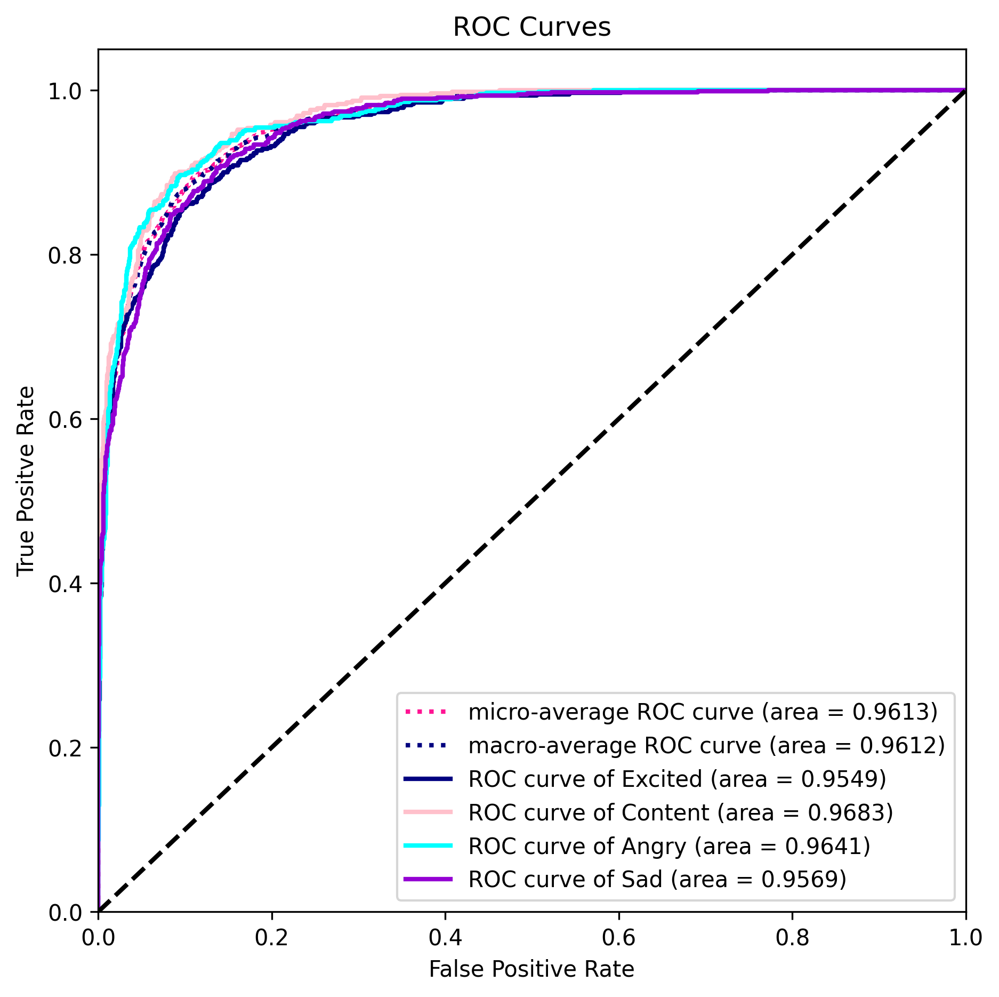

done


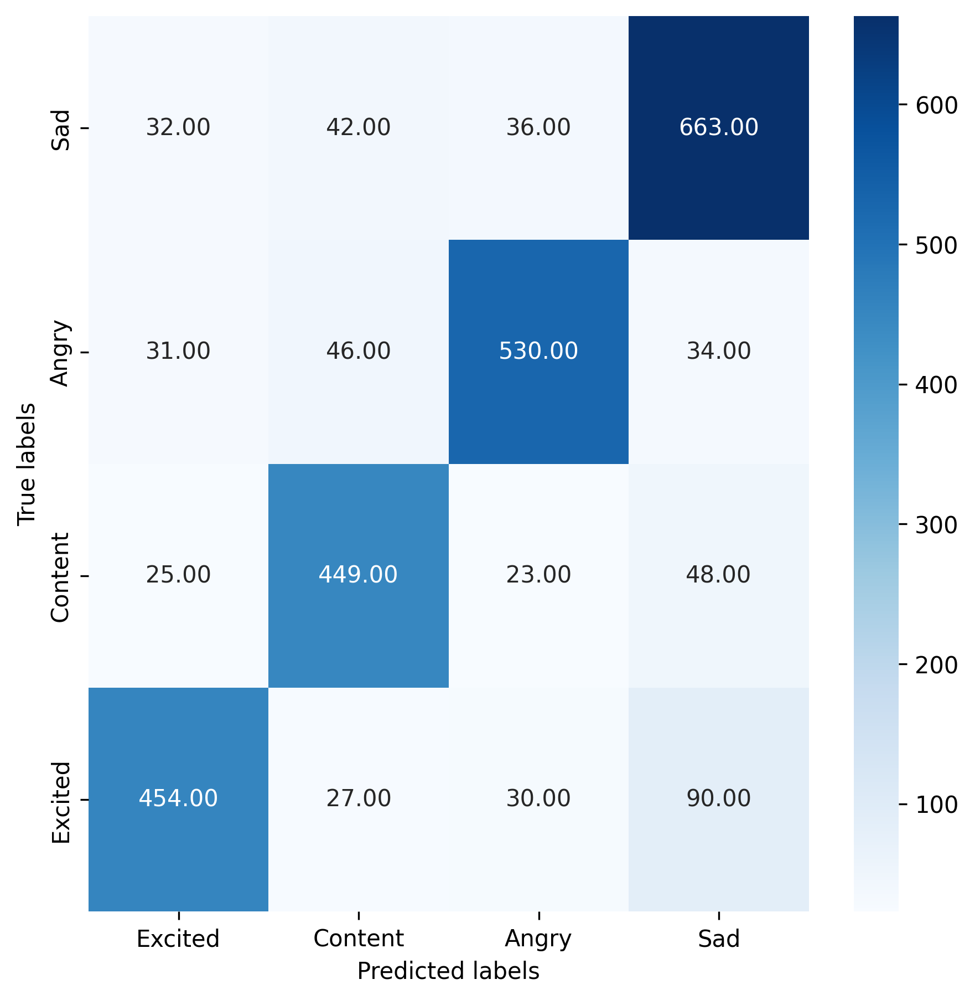

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3179 - loss: 1.3934
Epoch 1: val_accuracy improved from -inf to 0.37695, saving model to model/model_best_within_t1_1.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - accuracy: 0.3182 - loss: 1.3929 - val_accuracy: 0.3770 - val_loss: 1.3309 - learning_rate: 0.0010
Epoch 2/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3830 - loss: 1.2997
Epoch 2: val_accuracy improved from 0.37695 to 0.44336, saving model to model/model_best_within_t1_1.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - accuracy: 0.3831 - loss: 1.2996 - val_accuracy: 0.4434 - val_loss: 1.2232 - learning_rate: 0.0010
Epoch 3/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.4041 - loss: 1.2706
Epoch 3: val_accuracy improved from 0.44336 to 0.45508, saving model to model/model_best_within_t1_1.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - accuracy: 0.4042 - loss: 1.2706 - val_accuracy: 0.4551 - val_loss: 1.2140 

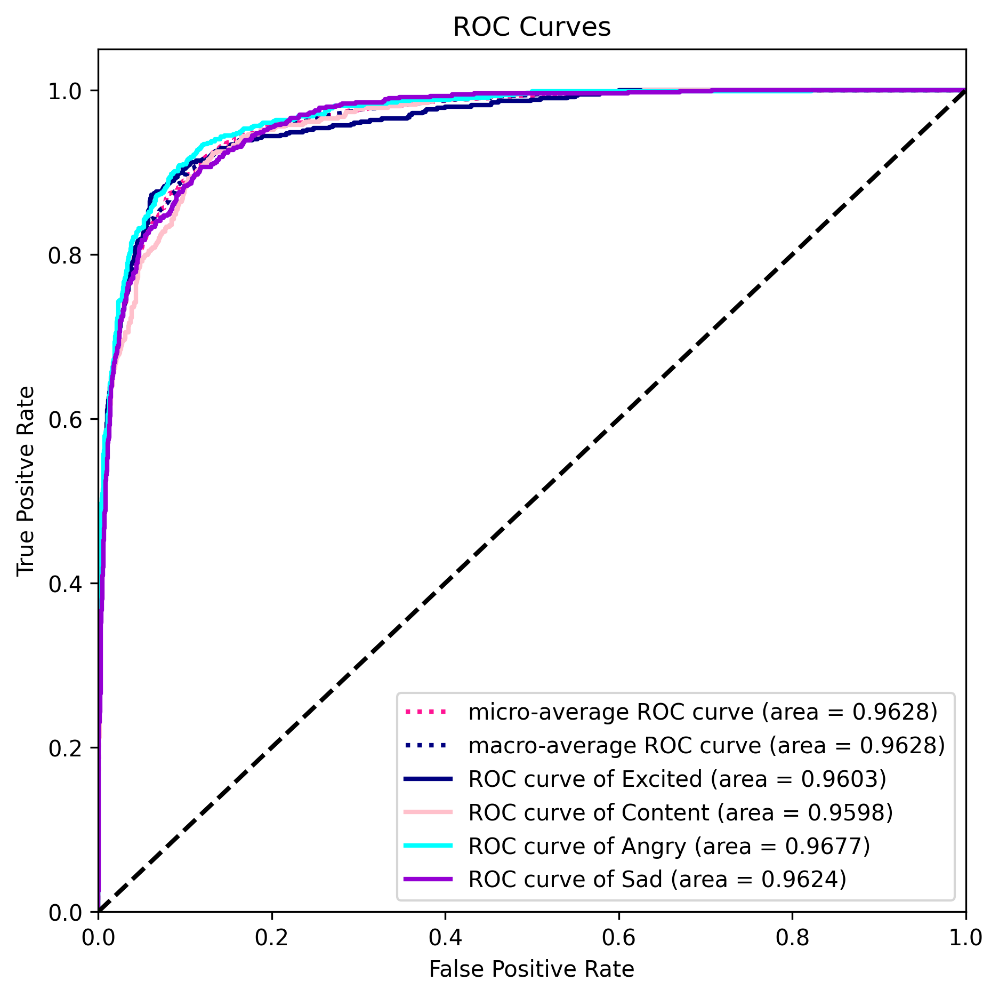

done


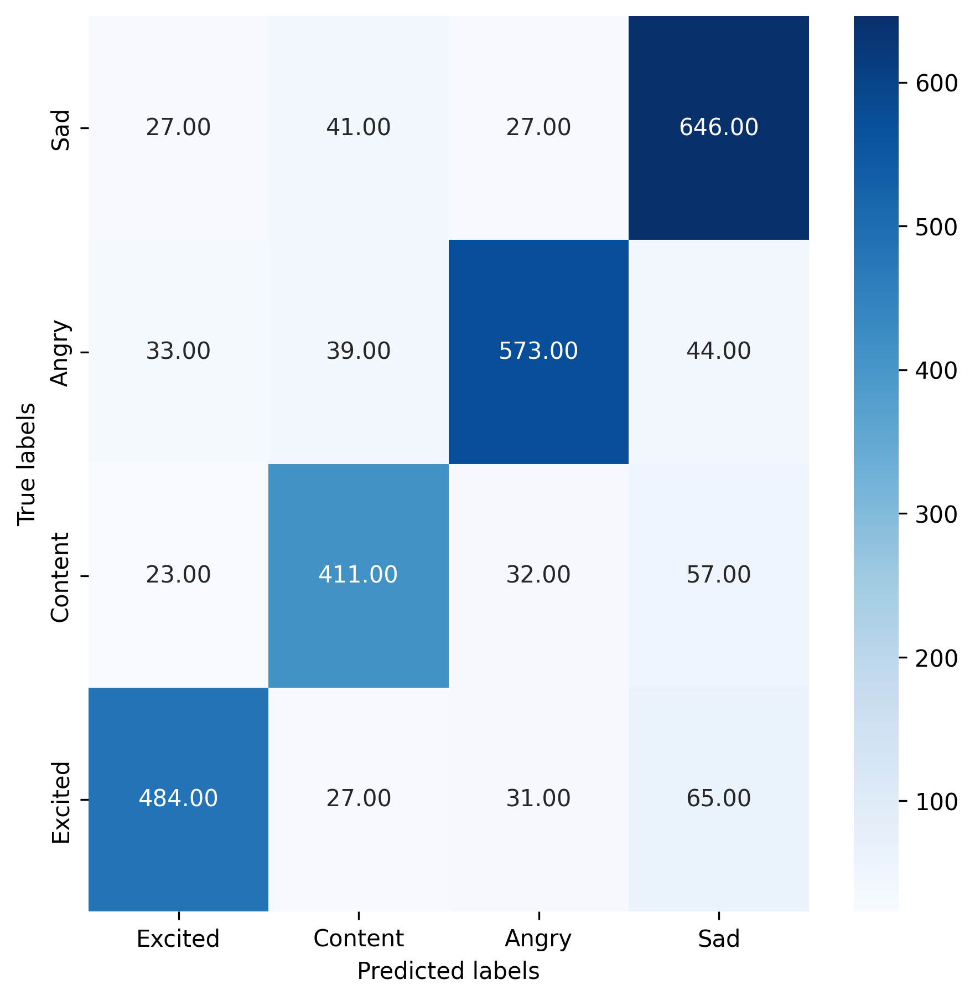

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3224 - loss: 1.3810
Epoch 1: val_accuracy improved from -inf to 0.37930, saving model to model/model_best_within_t1_2.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step - accuracy: 0.3228 - loss: 1.3806 - val_accuracy: 0.3793 - val_loss: 1.3075 - learning_rate: 0.0010
Epoch 2/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3890 - loss: 1.2926
Epoch 2: val_accuracy improved from 0.37930 to 0.41367, saving model to model/model_best_within_t1_2.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.3891 - loss: 1.2925 - val_accuracy: 0.4137 - val_loss: 1.2792 - learning_rate: 0.0010
Epoch 3/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4166 - loss: 1.2628
Epoch 3: val_accuracy improved from 0.41367 to 0.41406, saving model to model/model_best_within_t1_2.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - accuracy: 0.4166 - loss: 1.2628 - val_accuracy: 0.4141 - val_loss: 1.2796 

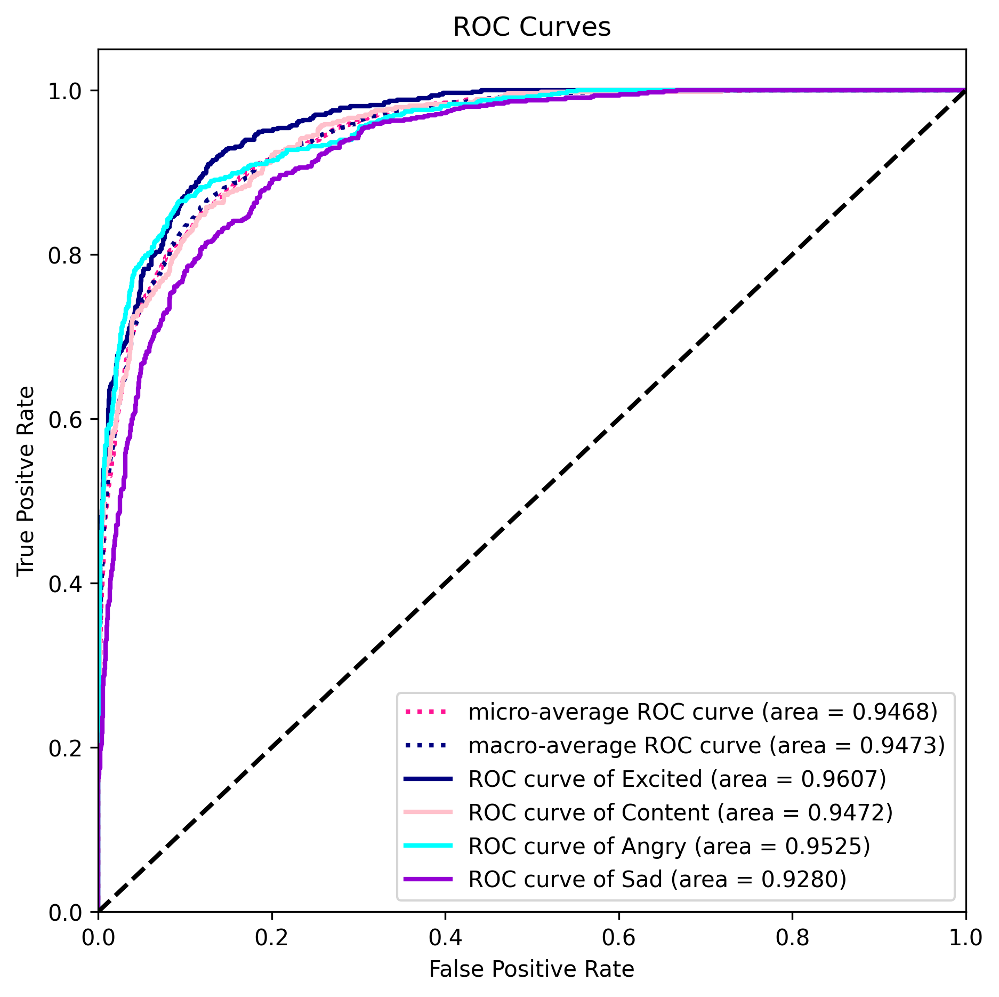

done


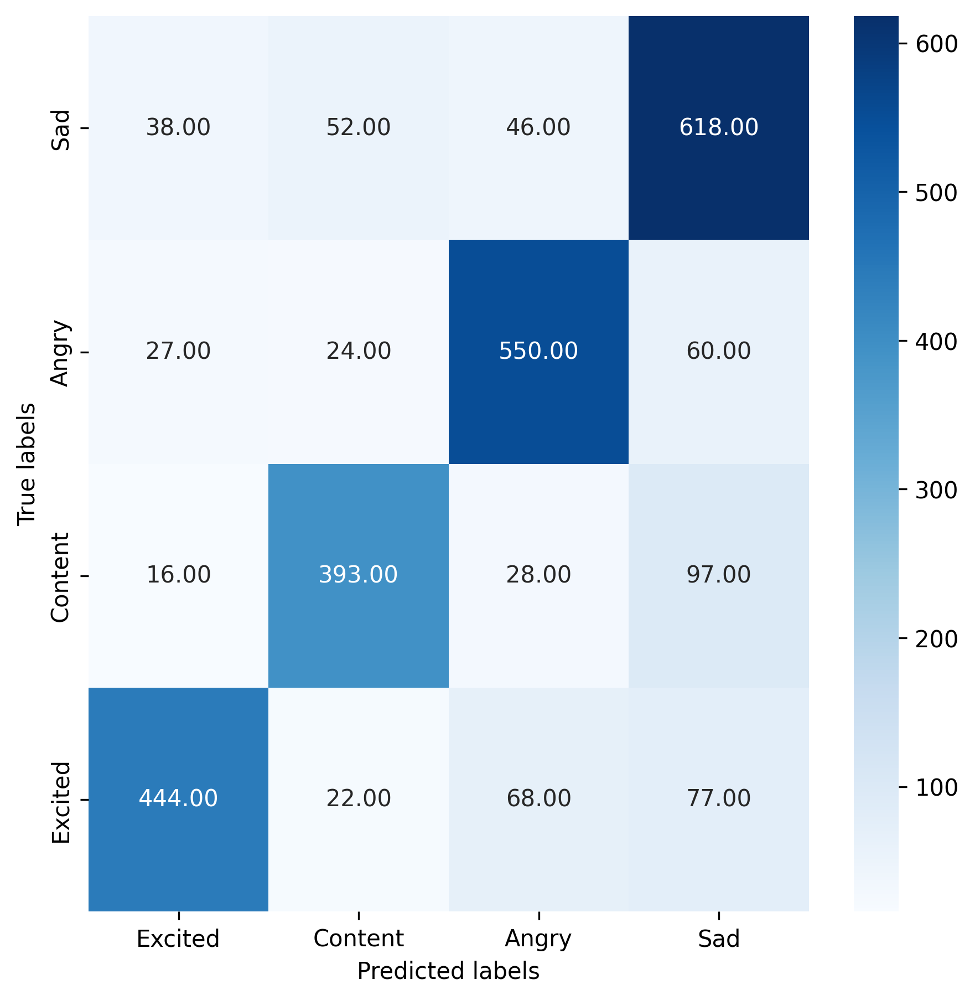

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3173 - loss: 1.3919
Epoch 1: val_accuracy improved from -inf to 0.37578, saving model to model/model_best_within_t1_3.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.3176 - loss: 1.3913 - val_accuracy: 0.3758 - val_loss: 1.3079 - learning_rate: 0.0010
Epoch 2/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3945 - loss: 1.2840
Epoch 2: val_accuracy improved from 0.37578 to 0.40625, saving model to model/model_best_within_t1_3.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - accuracy: 0.3945 - loss: 1.2840 - val_accuracy: 0.4062 - val_loss: 1.2787 - learning_rate: 0.0010
Epoch 3/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3983 - loss: 1.2774
Epoch 3: val_accuracy improved from 0.40625 to 0.42188, saving model to model/model_best_within_t1_3.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - accuracy: 0.3984 - loss: 1.2773 - val_accuracy: 0.4219 - val_loss: 1.2880 

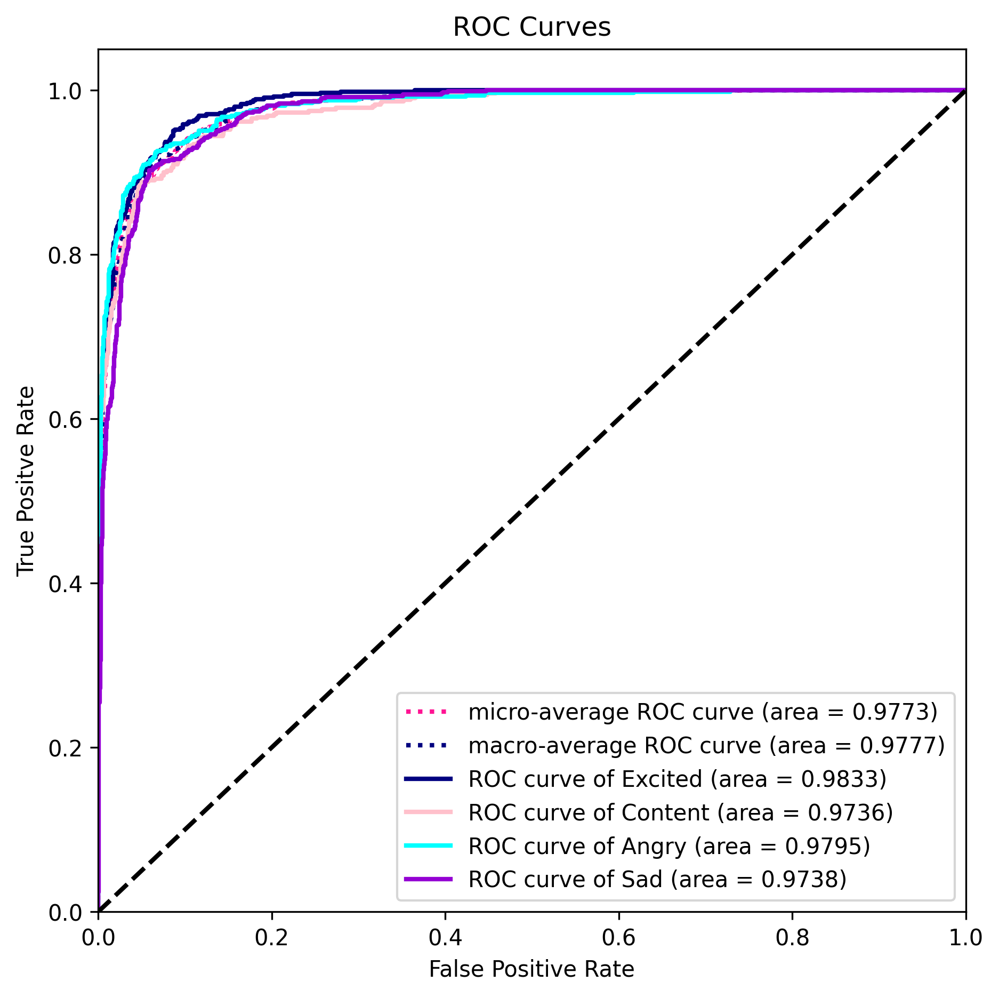

done


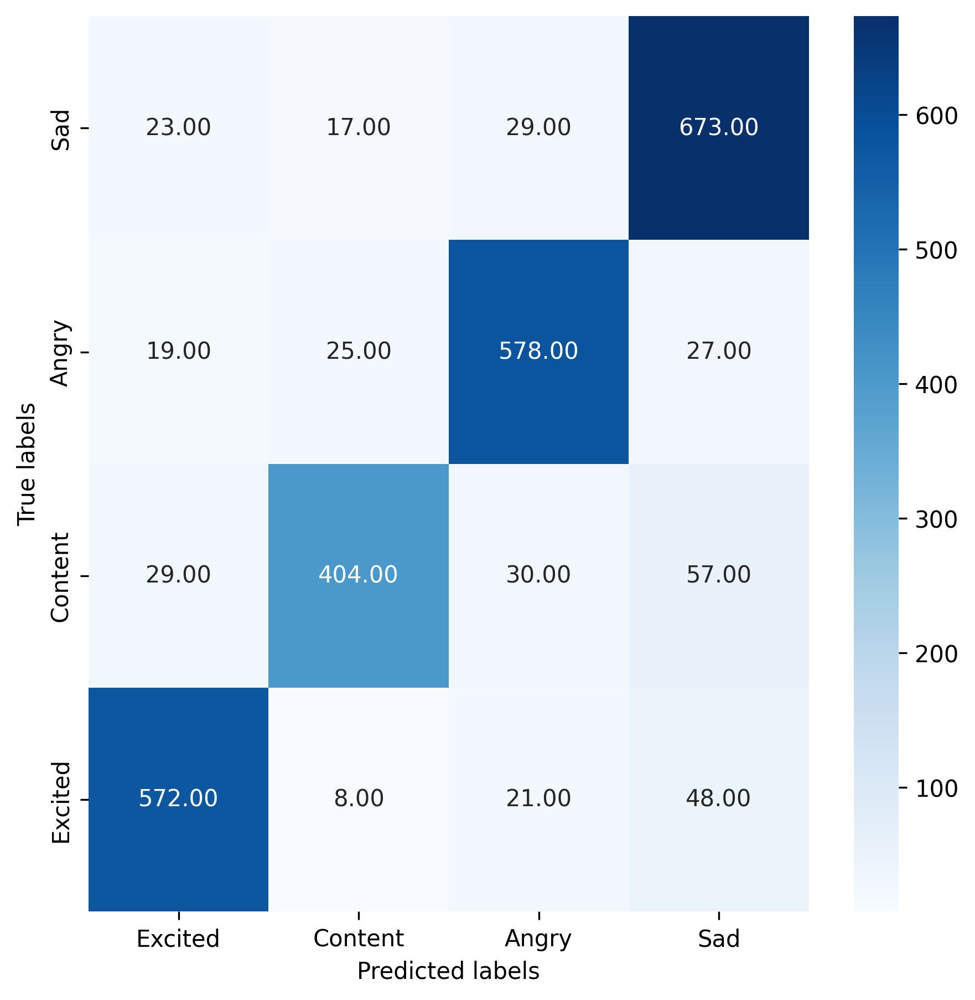

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3145 - loss: 1.4010
Epoch 1: val_accuracy improved from -inf to 0.36289, saving model to model/model_best_within_t1_4.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step - accuracy: 0.3148 - loss: 1.4005 - val_accuracy: 0.3629 - val_loss: 1.3674 - learning_rate: 0.0010
Epoch 2/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3876 - loss: 1.2985
Epoch 2: val_accuracy improved from 0.36289 to 0.42500, saving model to model/model_best_within_t1_4.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step - accuracy: 0.3876 - loss: 1.2984 - val_accuracy: 0.4250 - val_loss: 1.2796 - learning_rate: 0.0010
Epoch 3/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4040 - loss: 1.2720
Epoch 3: val_accuracy improved from 0.42500 to 0.43125, saving model to model/model_best_within_t1_4.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - accuracy: 0.4040 - loss: 1.2720 - val_accuracy: 0.4313 - val_loss: 1.2555

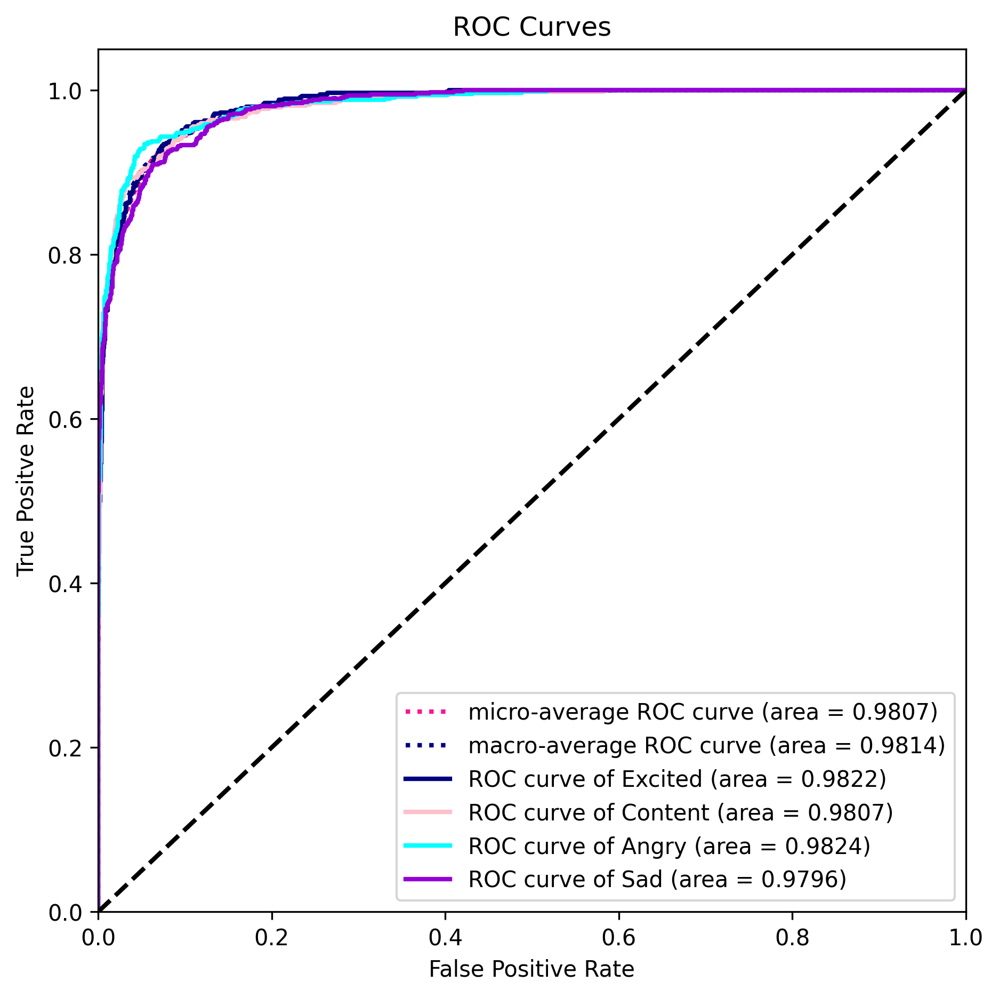

done


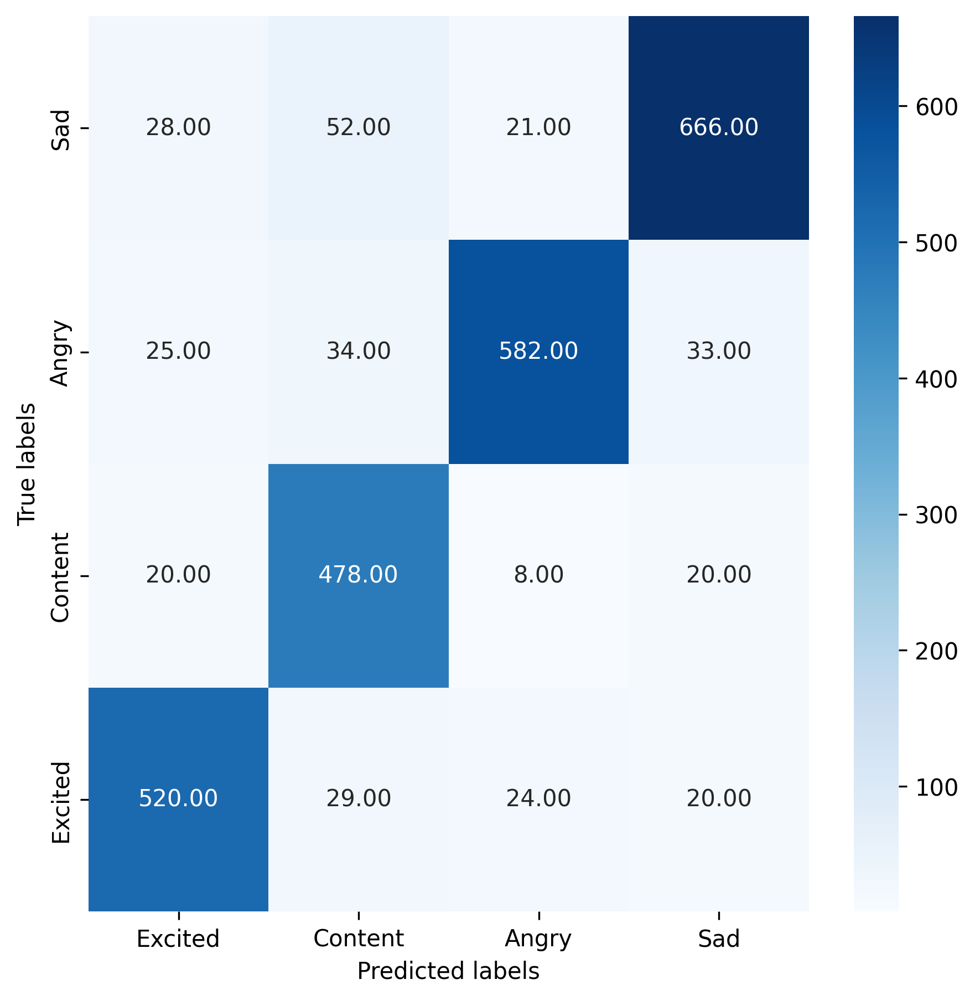

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3203 - loss: 1.3883
Epoch 1: val_accuracy improved from -inf to 0.40547, saving model to model/model_best_within_t1_5.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.3206 - loss: 1.3878 - val_accuracy: 0.4055 - val_loss: 1.3061 - learning_rate: 0.0010
Epoch 2/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3939 - loss: 1.2951
Epoch 2: val_accuracy improved from 0.40547 to 0.42344, saving model to model/model_best_within_t1_5.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.3939 - loss: 1.2950 - val_accuracy: 0.4234 - val_loss: 1.2537 - learning_rate: 0.0010
Epoch 3/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4101 - loss: 1.2623
Epoch 3: val_accuracy improved from 0.42344 to 0.43125, saving model to model/model_best_within_t1_5.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.4102 - loss: 1.2623 - val_accuracy: 0.4313 - val_loss: 1.2547 

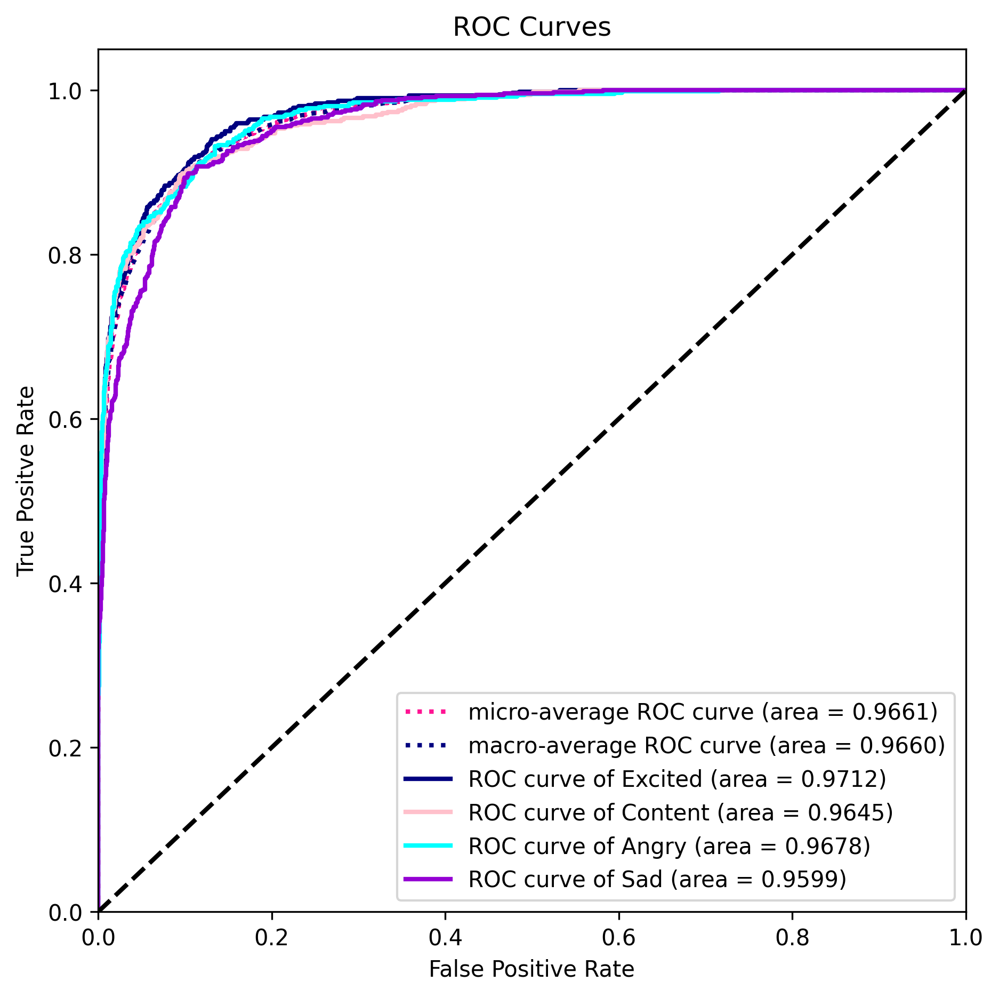

done


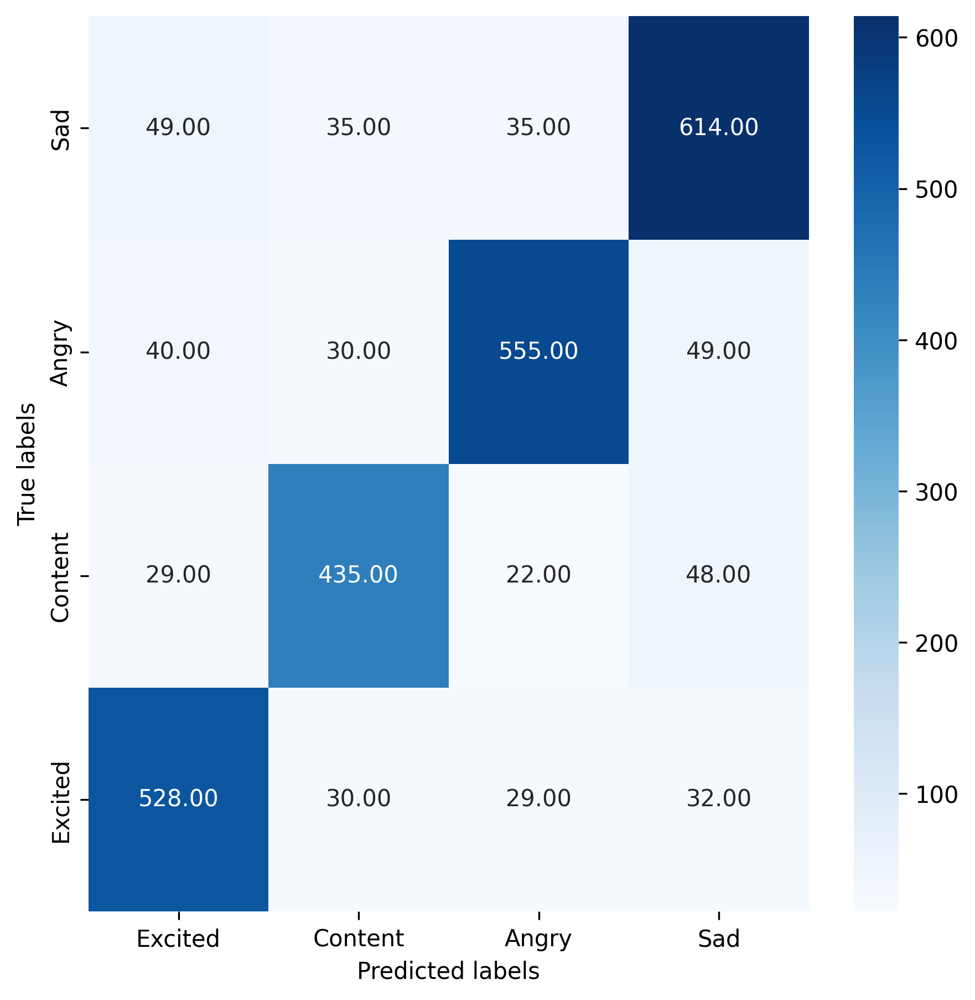

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3269 - loss: 1.3723
Epoch 1: val_accuracy improved from -inf to 0.39375, saving model to model/model_best_within_t1_6.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step - accuracy: 0.3273 - loss: 1.3719 - val_accuracy: 0.3938 - val_loss: 1.2987 - learning_rate: 0.0010
Epoch 2/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4003 - loss: 1.2835
Epoch 2: val_accuracy improved from 0.39375 to 0.41367, saving model to model/model_best_within_t1_6.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.4003 - loss: 1.2835 - val_accuracy: 0.4137 - val_loss: 1.2613 - learning_rate: 0.0010
Epoch 3/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4169 - loss: 1.2629
Epoch 3: val_accuracy improved from 0.41367 to 0.42266, saving model to model/model_best_within_t1_6.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.4170 - loss: 1.2628 - val_accuracy: 0.4227 - val_loss: 1.2403 

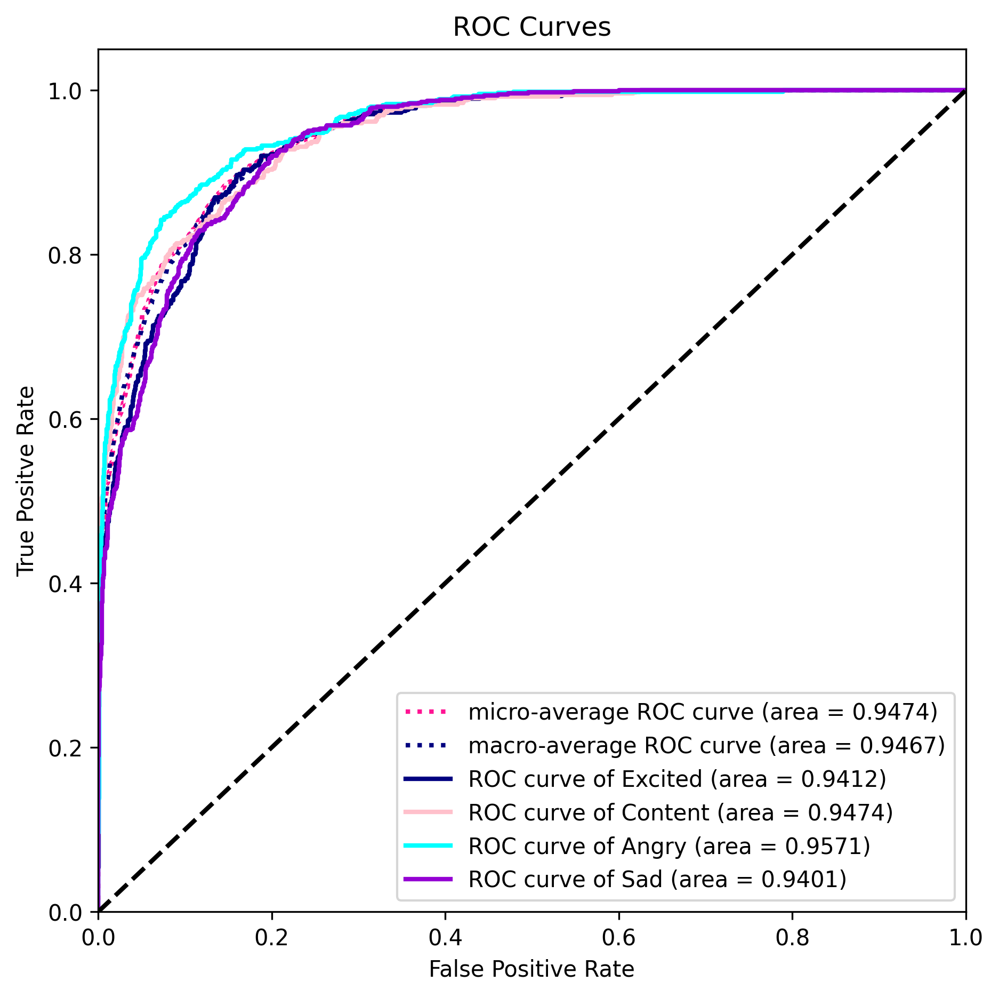

done


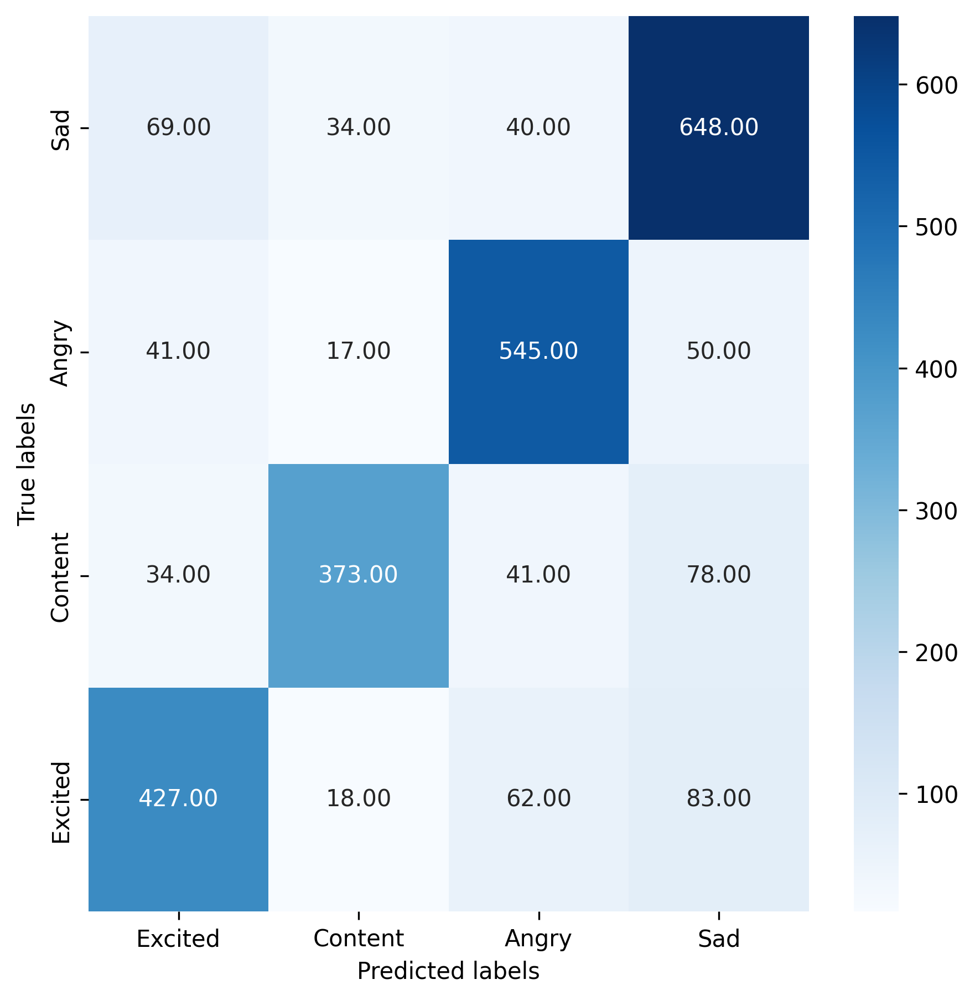

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3188 - loss: 1.3796
Epoch 1: val_accuracy improved from -inf to 0.33750, saving model to model/model_best_within_t1_7.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step - accuracy: 0.3191 - loss: 1.3792 - val_accuracy: 0.3375 - val_loss: 1.3602 - learning_rate: 0.0010
Epoch 2/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3865 - loss: 1.2945
Epoch 2: val_accuracy improved from 0.33750 to 0.42461, saving model to model/model_best_within_t1_7.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.3866 - loss: 1.2944 - val_accuracy: 0.4246 - val_loss: 1.2520 - learning_rate: 0.0010
Epoch 3/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4104 - loss: 1.2626
Epoch 3: val_accuracy improved from 0.42461 to 0.44023, saving model to model/model_best_within_t1_7.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.4104 - loss: 1.2626 - val_accuracy: 0.4402 - val_loss: 1.2466 

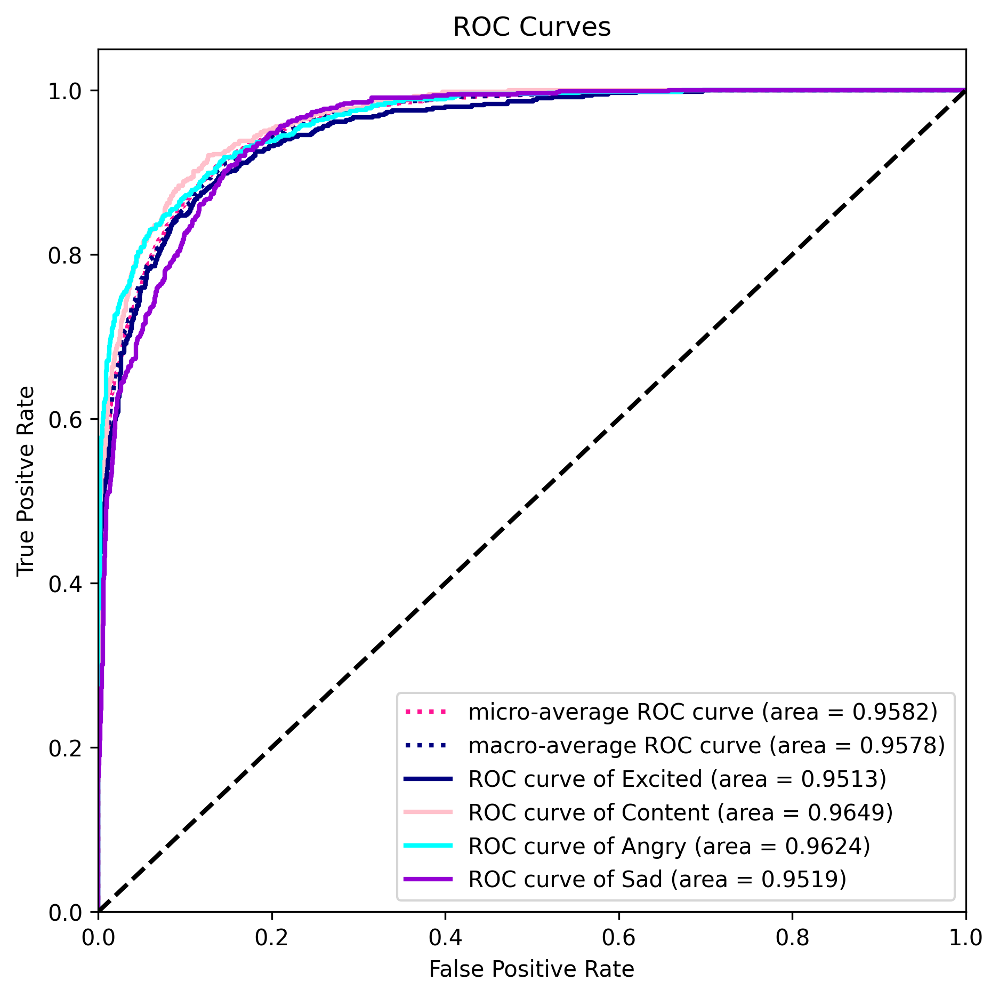

done


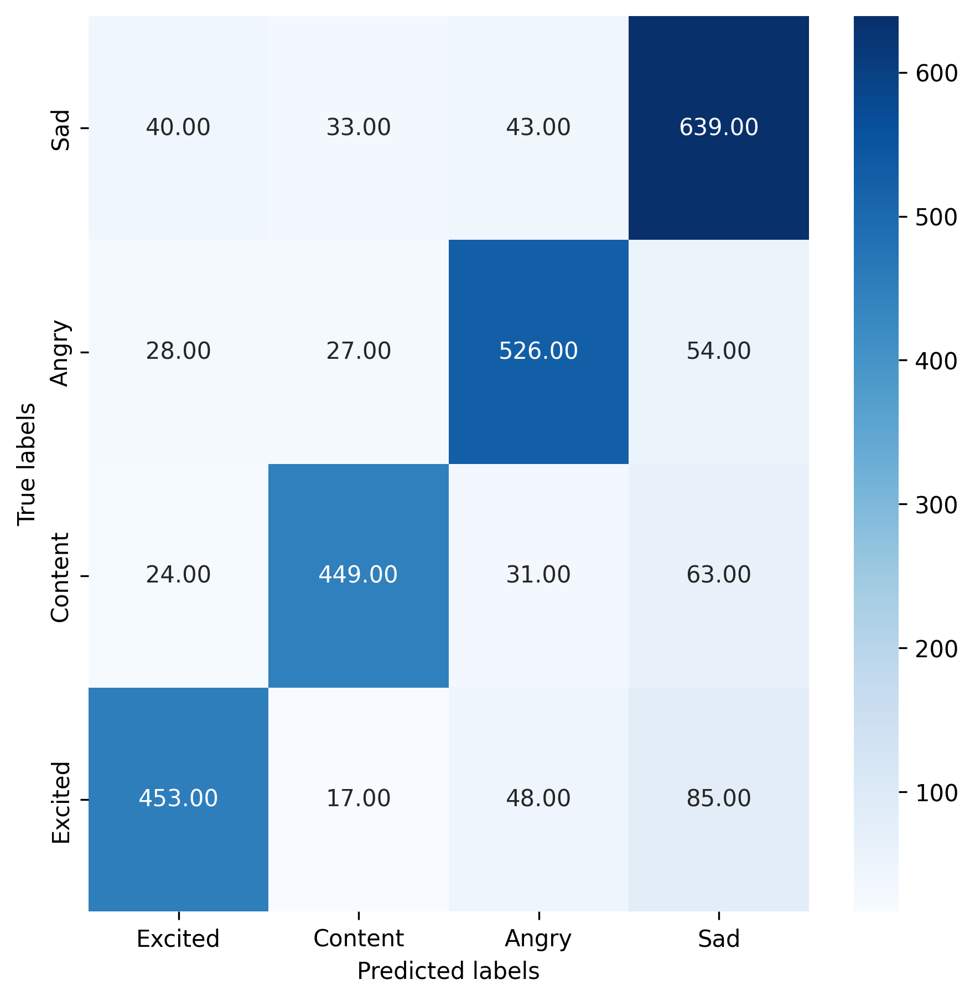

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3272 - loss: 1.3829
Epoch 1: val_accuracy improved from -inf to 0.32539, saving model to model/model_best_within_t1_8.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.3275 - loss: 1.3825 - val_accuracy: 0.3254 - val_loss: 1.3364 - learning_rate: 0.0010
Epoch 2/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3975 - loss: 1.2953
Epoch 2: val_accuracy improved from 0.32539 to 0.40078, saving model to model/model_best_within_t1_8.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - accuracy: 0.3975 - loss: 1.2953 - val_accuracy: 0.4008 - val_loss: 1.2908 - learning_rate: 0.0010
Epoch 3/200
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4143 - loss: 1.2677
Epoch 3: val_accuracy improved from 0.40078 to 0.41914, saving model to model/model_best_within_t1_8.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.4143 - loss: 1.2677 - val_accuracy: 0.4191 - val_loss: 1.2655 

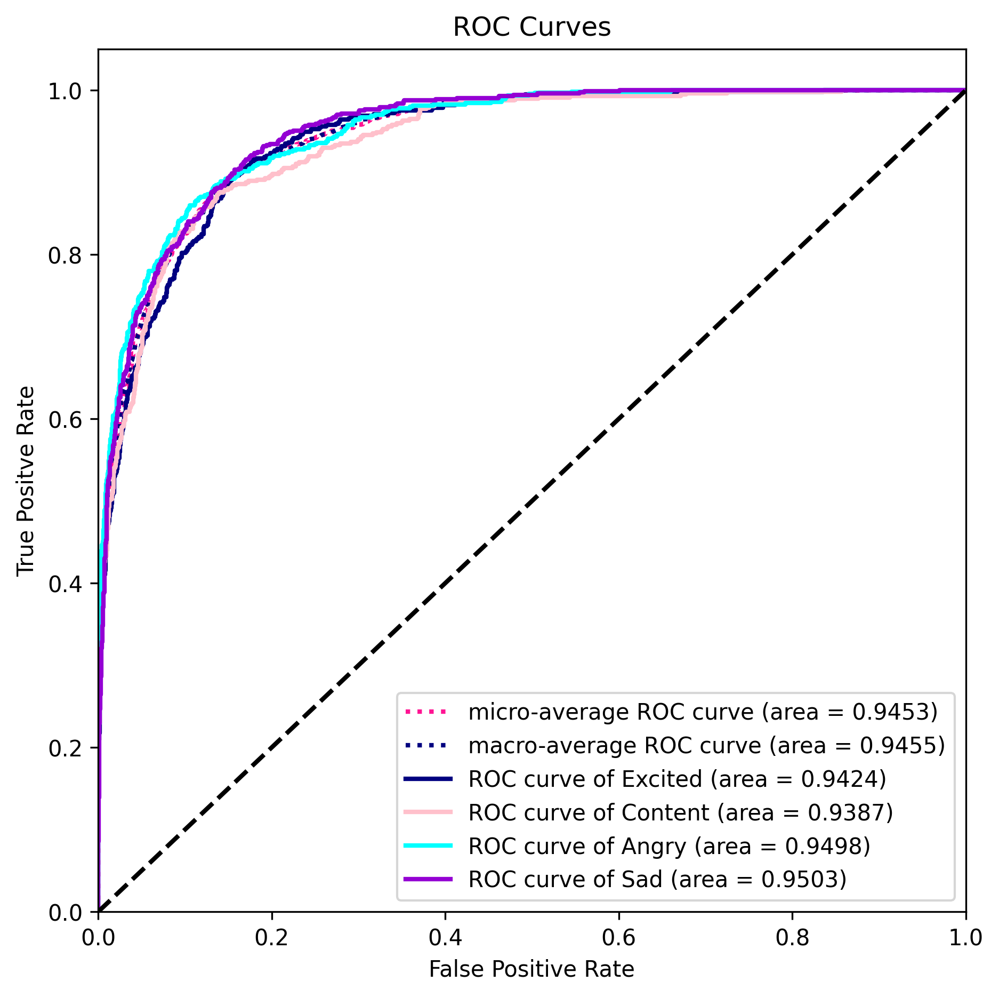

done


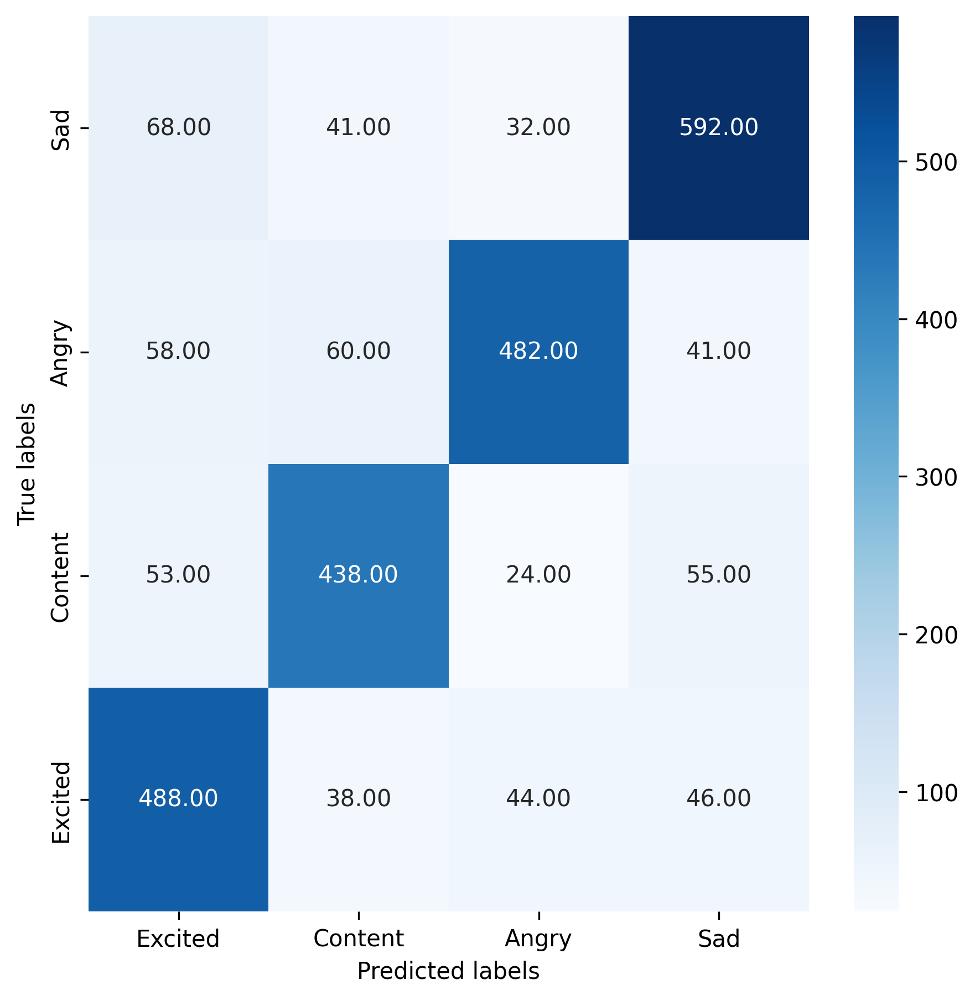

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3162 - loss: 1.3893
Epoch 1: val_accuracy improved from -inf to 0.39883, saving model to model/model_best_within_t1_9.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step - accuracy: 0.3166 - loss: 1.3888 - val_accuracy: 0.3988 - val_loss: 1.3003 - learning_rate: 0.0010
Epoch 2/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3893 - loss: 1.2880
Epoch 2: val_accuracy improved from 0.39883 to 0.44141, saving model to model/model_best_within_t1_9.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.3893 - loss: 1.2880 - val_accuracy: 0.4414 - val_loss: 1.2640 - learning_rate: 0.0010
Epoch 3/200
179/180 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.4019 - loss: 1.2658
Epoch 3: val_accuracy improved from 0.44141 to 0.44727, saving model to model/model_best_within_t1_9.weights.h5
180/180 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.4020 - loss: 1.2657 - val_accuracy: 0.4473 - val_loss: 1.2411 

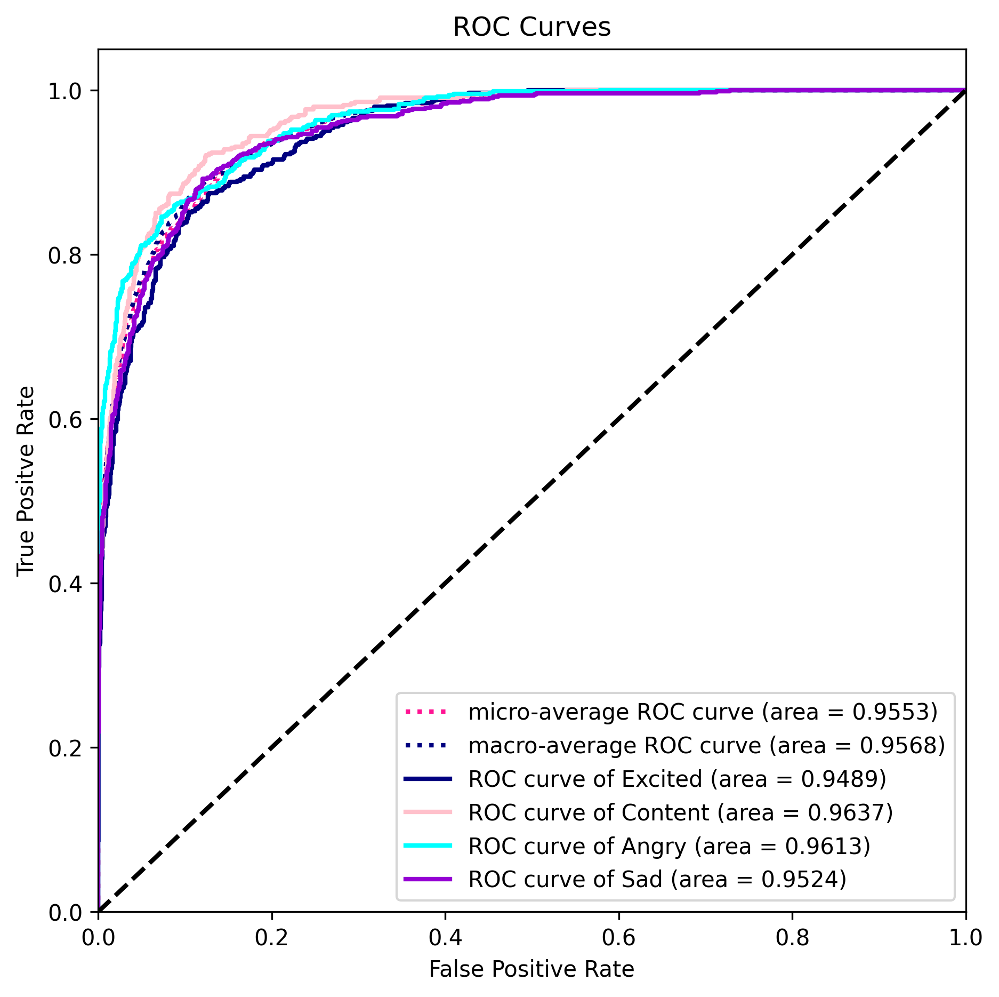

done


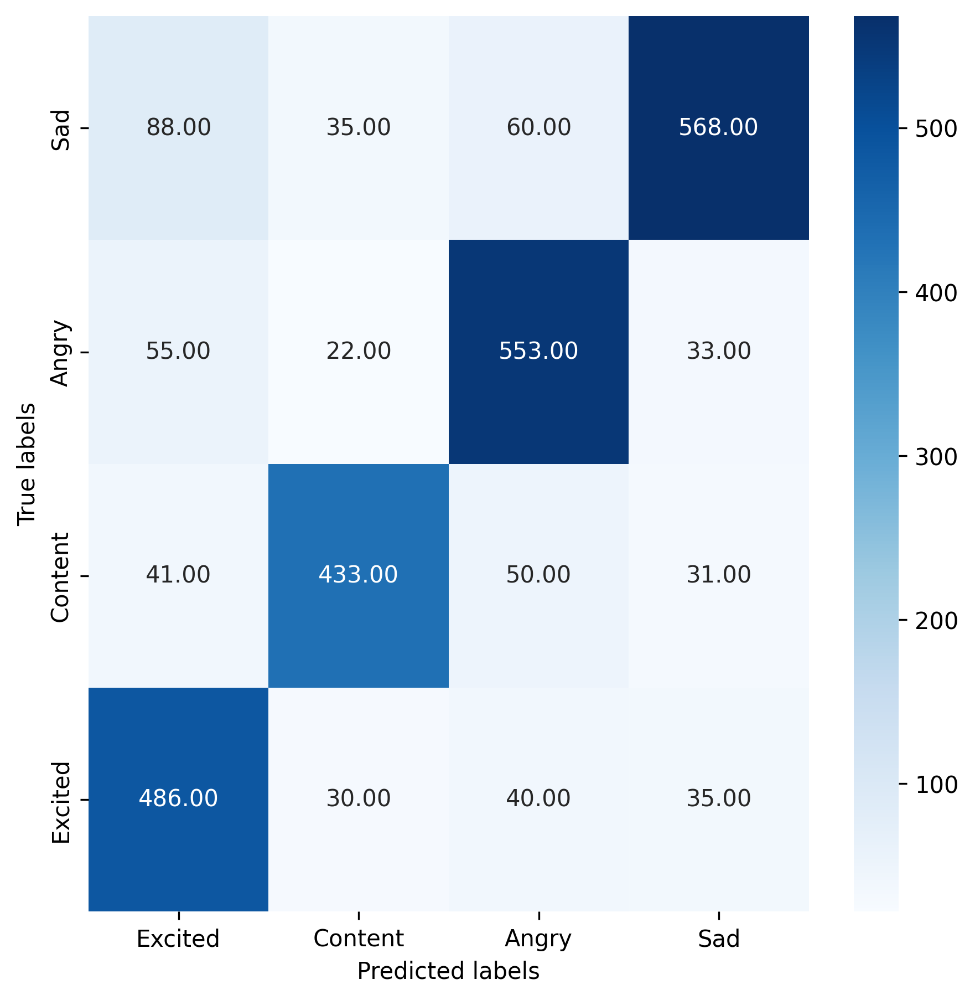

done


Model: "functional_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_41 (InputLayer)     │ (None, 32, 512, 1)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_41 (Conv2D)              │ (None, 32, 512, 8)     │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_123         │ (None, 32, 512, 8)     │            32 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ depthwise_conv2d_41             │ (None, 1, 512, 32)     │         1,024 │
│ (DepthwiseConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_124         │ (None, 1, 512, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_82 (Activation)      │ (None, 1, 512, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_41            │ (None, 1, 128, 32)     │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_164 (Dropout)           │ (None, 1, 128, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_41             │ (None, 1, 128, 32)     │         1,536 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_125         │ (None, 1, 128, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_83 (Activation)      │ (None, 1, 128, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_41 (Lambda)              │ (None, 128, 32)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ learnable_positional_encoding_… │ (None, 128, 32)        │        16,000 │
│ (LearnablePositionalEncoding)   │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ transformer_block_41            │ (None, 128, 32)        │        34,720 │
│ (TransformerBlock)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_41     │ (None, 32)             │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_167 (Dropout)           │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 4)              │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ softmax (Activation)            │ (None, 4)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 162,338 (634.14 KB)

 Trainable params: 54,064 (211.19 KB)

 Non-trainable params: 144 (576.00 B)

 Optimizer params: 108,130 (422.39 KB)

[0.8187500238418579, 0.8257812261581421, 0.783203125, 0.869921863079071, 0.8773437738418579, 0.832812488079071, 0.778515636920929, 0.807421863079071, 0.78125, 0.796875]
Accuracy: 81.72% (+/- 3.34%)
ERTNet Train End.


In [18]:
import logging
ertnet_logger = logging.getLogger('ertnet_logger')
ertnet_logger.setLevel(logging.INFO)
os.makedirs('logs', exist_ok=True)
os.makedirs('model', exist_ok=True)
os.makedirs('picture', exist_ok=True)
file_handler = logging.FileHandler('logs/ertnet.log')
ertnet_logger.addHandler(file_handler)

import numpy as np
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []

# Load data
data = np.load('data_processed/train_data.npy')
labels = np.load('data_processed/train_labels.npy')
labels = np.argmax(labels, axis=1)
# Convert labels to categorical one-hot encoding
labels = to_categorical(labels)

# Load Hyperparamters
# from config import Model_Config_DEAP
class Model_Config_DEAP:
    K = 10

    nb_classes=4
    Chans=32
    Samples=512
    dropoutRate=0.5
    kernLength=64
    F1=8
    D=4
    F2=32
    dropoutType='Dropout'

    es_patience=50
    batch_size = 128
    max_epochs = 200
    lr_begin = 1e-3
    lr_end = 1e-5
    re_lr_patience = 10
    re_lr_factor = 0.1
params = Model_Config_DEAP

# 10-fold cross validation
kf = KFold(n_splits=params.K,shuffle=True,random_state=42)
i = 0
for train_index, test_index in kf.split(data):

    train_data, test_data = data[train_index], data[test_index]
    train_labels, test_labels = labels[train_index], labels[test_index]

    early_stop = EarlyStopping(monitor='val_loss', patience=params.es_patience, verbose=1)
    # Set model checkpoint callback
    checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_t1_{i}.weights.h5',
                                 monitor='val_accuracy',
                                 verbose=1, save_best_only=True, mode='max', save_weights_only=True)
    # Load model
    model = ertnet(nb_classes=params.nb_classes, Chans=params.Chans,
                    Samples=params.Samples, dropoutRate=params.dropoutRate,
                    kernLength=params.kernLength, F1=params.F1, D=params.D,
                    F2=params.F2)
    # Use tf.keras.optimizers.Adam instead of keras.optimizers.adam_v2.Adam
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=params.lr_begin),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    # Set reduce learning rate callback
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=params.re_lr_factor,
                                  patience=params.re_lr_patience, mode='auto',
                                  min_lr=params.lr_end)
    # Fit model
    hist = model.fit(train_data, train_labels, epochs=params.max_epochs,
                     batch_size=params.batch_size,
                     validation_data=(test_data, test_labels),
                     callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()])
    # Get the best accuracy on the validation set
    cv_scores.append(max(list(hist.history['val_accuracy'])))

    model_best = ertnet(nb_classes=params.nb_classes, Chans=params.Chans,
                        Samples=params.Samples, dropoutRate=params.dropoutRate,
                        kernLength=params.kernLength, F1=params.F1, D=params.D,
                        F2=params.F2)
    model_best.load_weights(f'model/model_best_within_t1_{i}.weights.h5')
    # Get the prediction on the test set
    pred = model_best.predict(test_data)
    # Plot ROC curve
    plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'],
                      colorlist=['navy', 'pink', 'cyan', 'darkviolet'],
                      file=f'picture/roc_within_t1_{i}.jpg',dpi=300)
    # Plot confusion matrix
    plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                         ClassSet=['Excited', 'Content', 'Angry', 'Sad'],
                         file=f'picture/hm_within_t1_{i}.jpg',dpi=300)
    ertnet_logger.info(f"{i} Fold Training Epochs Accuracy: {list(hist.history['val_accuracy'])}")
    i = i + 1
# Print model summary
model.summary()
# Save information to log file
print(cv_scores)
ertnet_logger.info(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
ertnet_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('ERTNet Train End.')

### VISUALIZE KERNELS

In [ ]:
from keras.models import load_model

model = ertnet(nb_classes=4, Chans=32, Samples=512, kernLength=64, F1=8, D=4, F2=32)

# Load the weights from the .h5 file
model.load_weights('/kaggle/working/model/model_best_within_t1_0.weights.h5')  # Modify the path as needed

# Get the layers by name or by index
conv1_layer = model.get_layer(index=1)  # This should correspond to the Conv2D layer
depthwise_conv_layer = model.get_layer(index=4)  # This should correspond to the DepthwiseConv2D layer
separable_conv_layer = model.get_layer(index=8)  # This should correspond to the separable_conv2d layer

# Visualize filters from the first Conv2D layer
def visualize_conv_kernels(weights, num_filters, chans, title='Conv2D Kernels'):
    fig, axes = plt.subpl ots(1, num_filters, figsize=(20, 5))
    for i in range(num_filters):
        ax = axes[i]
        kernel = weights[:, :, 0, i][0]  # Extract the ith filter
        ax.plot(kernel)  # Plot filter
    fig.suptitle(title)
    plt.show()


# Visualize DepthwiseConv2D filters (assuming depth_multiplier = D)
def visualize_depthwise_kernels(weights, chans, depth_multiplier, title='Depthwise Conv2D Kernels'):
    fig, axes = plt.subplots(1, depth_multiplier, figsize=(20, 5))
    for j in range(depth_multiplier):
        ax = axes[j]
        kernel = weights[j]  # Extract depthwise filter
        ax.plot(kernel)  # Plot filter
    fig.suptitle(title)
    plt.show()
    

def visualize_separable_kernels(weights, title='Separable Conv2D Kernels'):
    weights = weights[0, :, :, 0] 
    filters_transposed = weights.T  
    n_filters = filters_transposed.shape[0]

    plt.figure(figsize=(10, 5))  

    for i in range(n_filters):
        plt.subplot(4, 8, i+1)  
        plt.plot(filters_transposed[i].reshape(16, 1))  

    plt.suptitle('32 Filters Visualization (1x16)')
    plt.show()

conv1_weights = conv1_layer.get_weights()[0]
# Visualize Conv2D filters
visualize_conv_kernels(conv1_weights,8, 32, title='Conv2D Filters')

depthwise_weights = depthwise_conv_layer.get_weights()
# Visualize DepthwiseConv2D filters
visualize_depthwise_kernels(depthwise_weights, 32, 4, title='Depthwise Conv2D Filters')

# Visualize SeparablConv2D filters
separable_weights = separable_conv_layer.get_weights()[0]
visualize_separable_kernels(separable_weights)

## CL 

In [ ]:
import logging
cl_logger = logging.getLogger('cl_logger')
cl_logger.setLevel(logging.INFO)
os.makedirs('logs', exist_ok=True)
os.makedirs('model', exist_ok=True)
os.makedirs('picture', exist_ok=True)
file_handler = logging.FileHandler('logs/cl.log')
cl_logger.addHandler(file_handler)

import numpy as np
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []

# Load data
data = np.load('data_processed/train_data.npy')
labels = np.load('data_processed/train_labels.npy')
labels = np.argmax(labels, axis=1)
# Convert labels to categorical one-hot encoding
labels = to_categorical(labels)

train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size = 0.1, random_state=42)

early_stop = EarlyStopping(monitor='val_loss', patience=50, verbose=1)
checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_cl.weights.h5', 
                             monitor='val_accuracy', verbose=1, save_best_only=True, 
                             mode='max', save_weights_only=True)

model = CNN_BiLSTM(4, Chans = 32, Samples = 512, F1=8, D=4, F2=32)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=10,mode='auto',min_lr=1e-5)

hist = model.fit(train_data, train_labels, epochs=200,
                 batch_size=128,
                 validation_data=(test_data, test_labels),
                 callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()])

cv_scores.append(max(list(hist.history['val_accuracy'])))


pred = model.predict(test_data)

plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'], 
                  colorlist=['navy', 'pink', 'cyan', 'darkviolet'], 
                  file=f'picture/roc_within_cl.jpg',dpi=600)

plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                     ClassSet=['Excited', 'Content', 'Angry', 'Sad'], 
                     file=f'picture/hm_within_cl.jpg',dpi=600)
cl_logger.info(f"Training Epochs Accuracy: {list(hist.history['val_accuracy'])}")

model.summary()

print(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
cl_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('cl Train End.')


## DEEPCONVNET

In [ ]:
import logging
deepconvnet_logger = logging.getLogger('deepconvnet_logger')
deepconvnet_logger.setLevel(logging.INFO)
file_handler = logging.FileHandler('logs/deepconvnet.log')
deepconvnet_logger.addHandler(file_handler)

import numpy as np
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []

# Load data
data = np.load('data_processed/train_data.npy')
labels = np.load('data_processed/train_labels.npy')
labels = np.argmax(labels, axis=1)
# Convert labels to categorical one-hot encoding
labels = to_categorical(labels)

train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size = 0.1, random_state=42)

early_stop = EarlyStopping(monitor='val_loss', patience=50, verbose=1)

checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_deepconvnet.weights.h5', 
                             monitor='val_accuracy', verbose=1, save_best_only=True, 
                             mode='max', save_weights_only=True)

model = DeepConvNet(nb_classes=4, Chans = 32, Samples = 512, dropoutRate = 0.5)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=10,mode='auto',min_lr=1e-5)

hist = model.fit(train_data, train_labels, epochs=200,
                 batch_size=128,
                 validation_data=(test_data, test_labels),
                 callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()])

cv_scores.append(max(list(hist.history['val_accuracy'])))

model_best = DeepConvNet(nb_classes=4, Chans = 32, Samples = 512, dropoutRate = 0.5)
model_best.load_weights(f'model/model_best_within_deepconvnet.weights.h5')

pred = model_best.predict(test_data)

plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'], 
                  colorlist=['navy', 'pink', 'cyan', 'darkviolet'], 
                  file=f'picture/roc_within_deepconvnet.jpg',dpi=300)

plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                     ClassSet=['Excited', 'Content', 'Angry', 'Sad'], 
                     file=f'picture/hm_within_deepconvnet.jpg',dpi=300)
deepconvnet_logger.info(f"Training Epochs Accuracy: {list(hist.history['val_accuracy'])}")

model.summary()

print(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
deepconvnet_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('deepconvnet Train End.')


## EEGNET

In [ ]:
import logging
eegnet_logger = logging.getLogger('eegnet_logger')
eegnet_logger.setLevel(logging.INFO)
file_handler = logging.FileHandler('logs/eegnet.log')
eegnet_logger.addHandler(file_handler)

import numpy as np
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []

# Load data
data = np.load('data_processed/train_data.npy')
labels = np.load('data_processed/train_labels.npy')
labels = np.argmax(labels, axis=1)
# Convert labels to categorical one-hot encoding
labels = to_categorical(labels)

train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size = 0.1, random_state=42)

early_stop = EarlyStopping(monitor='val_loss', patience=50, verbose=1)
checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_eegnet.weights.h5', 
                             monitor='val_accuracy', verbose=1, save_best_only=True, 
                             mode='max', save_weights_only=True)

model = EEGNet(nb_classes=4, Chans=32, Samples=512, dropoutRate=0.5, kernLength=64, F1=8, D=4, F2=32)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=10,mode='auto',min_lr=1e-5)

hist = model.fit(train_data, train_labels, epochs=200,
                 batch_size=128,
                 validation_data=(test_data, test_labels),
                 callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()], verbose=0)

cv_scores.append(max(list(hist.history['val_accuracy'])))


model_best = EEGNet(nb_classes=4, Chans=32, Samples=512, dropoutRate=0.5, kernLength=64, F1=8, D=4, F2=32)
model_best.load_weights(f'model/model_best_within_eegnet.weights.h5')
pred = model_best.predict(test_data)

plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'], 
                  colorlist=['navy', 'pink', 'cyan', 'darkviolet'], 
                  file=f'picture/roc_within_eegnet.jpg',dpi=300)

plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                     ClassSet=['Excited', 'Content', 'Angry', 'Sad'], 
                     file=f'picture/hm_within_eegnet.jpg',dpi=300)
eegnet_logger.info(f"Training Epochs Accuracy: {list(hist.history['val_accuracy'])}")

model.summary()

print(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
eegnet_logger.info(cv_scores)
eegnet_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('EEGNet Train End.')


## SHALLOWCONVNET

In [ ]:
import logging
shallowconvnet_logger = logging.getLogger('shallowconvnet_logger')
shallowconvnet_logger.setLevel(logging.INFO)
file_handler = logging.FileHandler('logs/shallowconvnet.log')
shallowconvnet_logger.addHandler(file_handler)

import numpy as np
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []

data = np.load('data_processed/train_data.npy')
labels = np.load('data_processed/train_labels.npy')
labels = np.argmax(labels, axis=1)
# Convert labels to categorical one-hot encoding
labels = to_categorical(labels)

train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size = 0.1, random_state=42)

early_stop = EarlyStopping(monitor='val_loss', patience=50, verbose=1)
checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_shallowconvnet.weights.h5', 
                             monitor='val_accuracy', verbose=1, save_best_only=True, 
                             mode='max', save_weights_only=True)

model = ShallowConvNet(nb_classes=4, Chans = 32, Samples = 512, dropoutRate = 0.5)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=10,mode='auto',min_lr=1e-5)

hist = model.fit(train_data, train_labels, epochs=200,
                 batch_size=128,
                 validation_data=(test_data, test_labels),
                 callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()])

cv_scores.append(max(list(hist.history['val_accuracy'])))


model_best = ShallowConvNet(nb_classes=4, Chans = 32, Samples = 512, dropoutRate = 0.5)
model_best.load_weights(f'model/model_best_within_shallowconvnet.weights.h5')

pred = model_best.predict(test_data)

plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'], 
                  colorlist=['navy', 'pink', 'cyan', 'darkviolet'], 
                  file=f'picture/roc_within_shallowconvnet.jpg',dpi=300)

plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                     ClassSet=['Excited', 'Content', 'Angry', 'Sad'], 
                     file=f'picture/hm_within_shallowconvnet.jpg',dpi=300)
shallowconvnet_logger.info(f"Training Epochs Accuracy: {list(hist.history['val_accuracy'])}")


model.summary()

print(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
shallowconvnet_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('shallowconvnet Train End.')


# Subject Independent Testing

In [14]:
import _pickle as cPickle
import os
from tensorflow.keras.utils import to_categorical
import numpy as np
from sklearn.model_selection import train_test_split

# # Define the path to the preprocessed folder
preprocessed_folder = '/kaggle/input/deap-dataset/PREPROCESSED/data_preprocessed_python'

def losocv_data_split(test_file):
    """
    This function collects data from all files in the preprocessed folder except the test_file.
    The test_file is left out for testing, and the rest are used for training.
    
    Parameters:
    - preprocessed_folder: path to the folder containing preprocessed data files
    - test_file: the file to leave out for testing
    
    Returns:
    - train_data, train_labels: training data and labels from the other files
    - test_data, test_labels: test data and labels from the specified test_file
    """

    train_data = []
    train_labels = []
    test_data = []
    test_labels = []
    
    # Iterate through the files in the preprocessed folder
    for filename in os.listdir(preprocessed_folder):
        if filename.endswith('.dat'):
            # Load the data from the file
            filepath = os.path.join(preprocessed_folder, filename)
            dat = cPickle.load(open(filepath, 'rb'), encoding='latin1')

            if filename in test_file:
                # If this is the test file, store its data separately
                for sample in dat['data']:
                    test_data.append(sample)
                for label in dat['labels']:
                    test_labels.append(label)
            else:
                # Otherwise, append to the training data
                for sample in dat['data']:
                    train_data.append(sample)
                for label in dat['labels']:
                    train_labels.append(label)

    # Convert the lists to numpy arrays for test data
    train_data = np.array(train_data)
    train_data = train_data[:, :32]  # Keep only the first 32 channels (if needed)
    train_data = train_data.reshape(train_data.shape[0], train_data.shape[1], train_data.shape[2], 1)
    
    train_labels = np.array(train_labels)
    train_labels = np.argmax(train_labels, axis=1)
    # Convert labels to categorical one-hot encoding
    train_labels = to_categorical(train_labels)
    
    train_data, train_labels = segment_data(train_data, train_labels)
    train_labels = np.array(train_labels)
    train_data = np.array(train_data)
    train_data, val_data, train_labels, val_labels = train_test_split(train_data, train_labels, test_size = 0.3, random_state = 42)
    
    # Shuffle the training data
    num_samples = train_data.shape[0]
    shuffled_indices = np.random.permutation(num_samples)
    train_data = train_data[shuffled_indices]
    train_labels = train_labels[shuffled_indices]
    
    # Convert the lists to numpy arrays for testing data
    test_data = np.array(test_data)
    test_data = test_data[:, :32]  # Keep only the first 32 channels (if needed)
#     print(test_data.shape, train_data.shape)
    test_data = test_data.reshape(test_data.shape[0], test_data.shape[1], test_data.shape[2], 1)
    
    test_labels = np.array(test_labels)
    test_labels = np.argmax(test_labels, axis=1)
    # Convert labels to categorical one-hot encoding
    test_labels = to_categorical(test_labels)
    
    test_data, test_labels = segment_data(test_data, test_labels)
    test_data = np.array(test_data)
    test_labels = np.array(test_labels)

    return train_data, train_labels, test_data, test_labels, val_data, val_labels

test_file = ['s01.dat']  # Specify the file to leave out for testing

train_data, train_labels, test_data, test_labels, val_data, val_test = losocv_data_split(test_file)

In [15]:
print(test_data.shape)

(800, 32, 512, 1)


Epoch 1/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - accuracy: 0.3181 - loss: 1.3935
Epoch 1: val_accuracy improved from -inf to 0.28208, saving model to model/subject_independent_model_best_within_t1_0.weights.h5
127/127 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - accuracy: 0.3184 - loss: 1.3932 - val_accuracy: 0.2821 - val_loss: 1.3625 - learning_rate: 0.0010
Epoch 2/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3948 - loss: 1.2980
Epoch 2: val_accuracy did not improve from 0.28208
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.3947 - loss: 1.2979 - val_accuracy: 0.2746 - val_loss: 1.4501 - learning_rate: 0.0010
Epoch 3/200
126/127 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4032 - loss: 1.2746
Epoch 3: val_accuracy improved from 0.28208 to 0.28458, saving model to model/subject_independent_model_best_within_t1_0.weights.h5
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.4032 - loss: 1.2746 - val_accuracy: 0.2846 - val_loss: 1.4132 - learning_rate: 0.

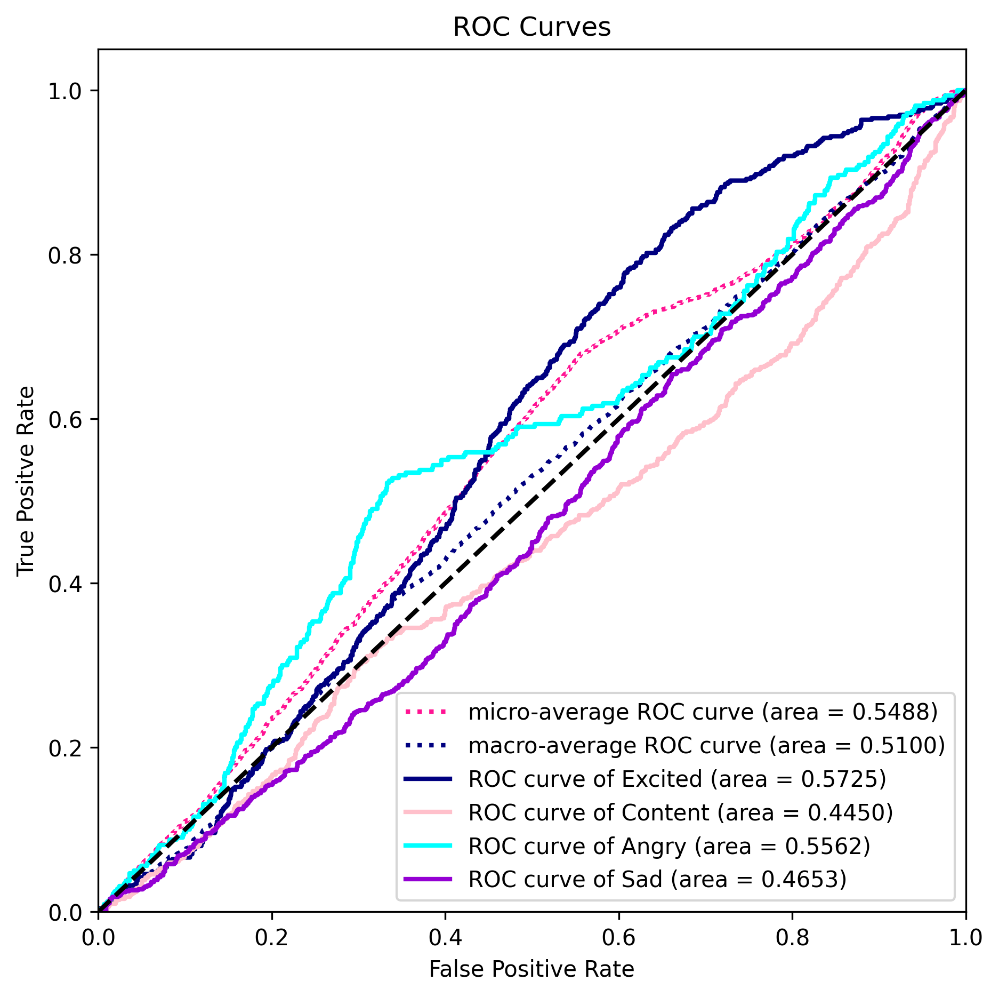

done


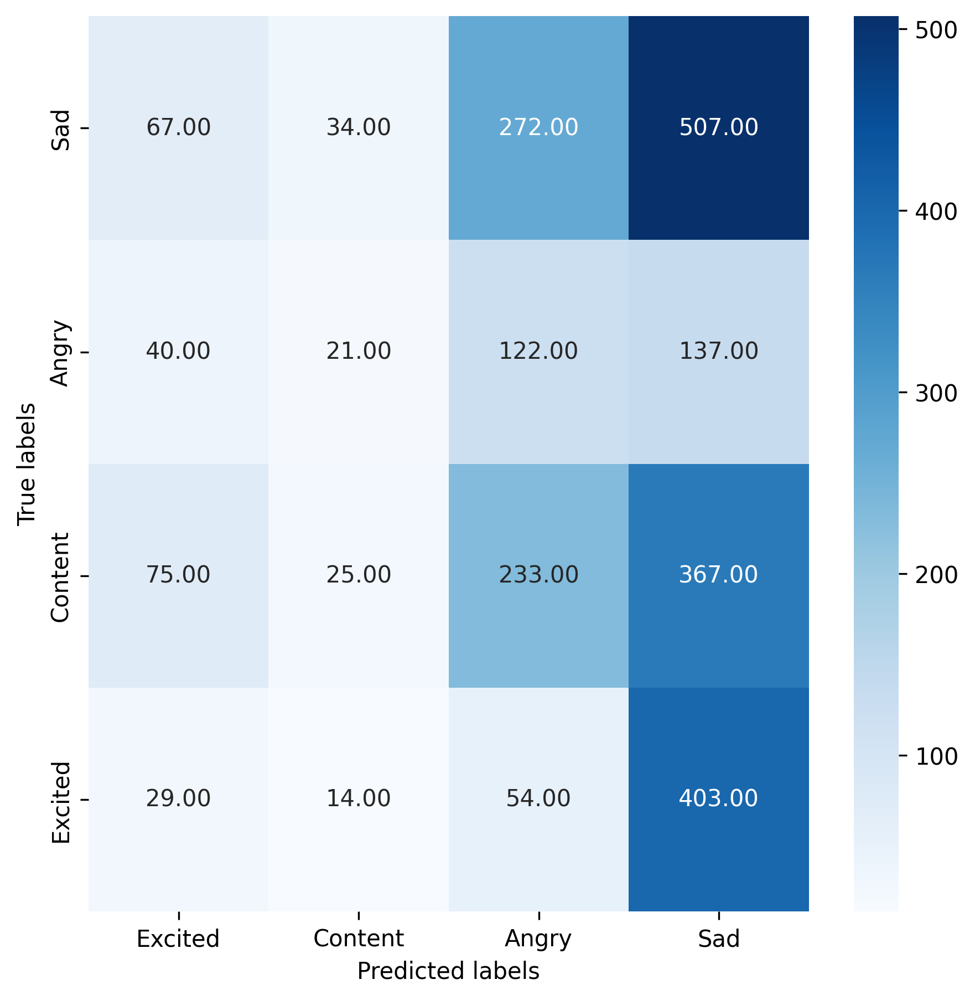

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.3038 - loss: 1.4098
Epoch 1: val_accuracy improved from -inf to 0.32750, saving model to model/subject_independent_model_best_within_t1_1.weights.h5
127/127 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - accuracy: 0.3040 - loss: 1.4095 - val_accuracy: 0.3275 - val_loss: 1.4144 - learning_rate: 0.0010
Epoch 2/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3669 - loss: 1.3263
Epoch 2: val_accuracy did not improve from 0.32750
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.3670 - loss: 1.3262 - val_accuracy: 0.2713 - val_loss: 1.4875 - learning_rate: 0.0010
Epoch 3/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3819 - loss: 1.3052
Epoch 3: val_accuracy did not improve from 0.32750
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.3820 - loss: 1.3052 - val_accuracy: 0.1762 - val_loss: 1.6567 - learning_rate: 0.0010
Epoch 4/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3971 - lo

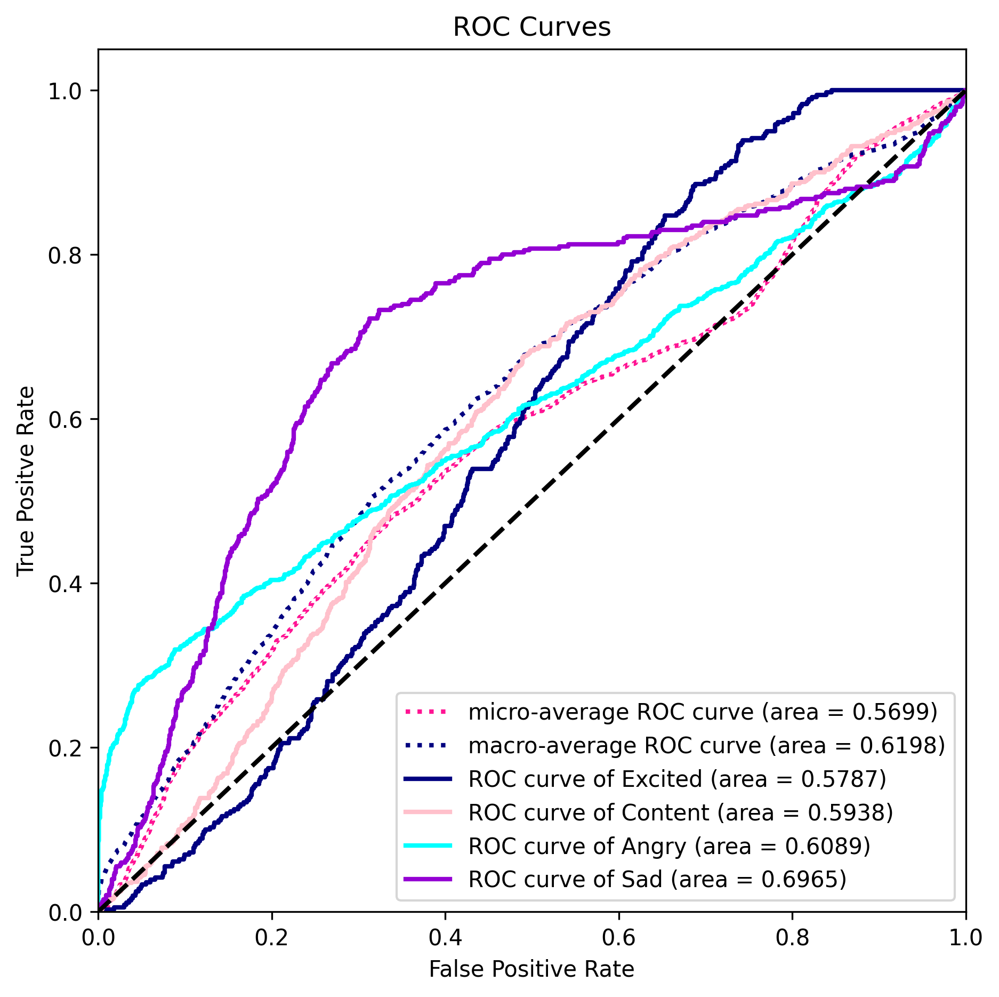

done


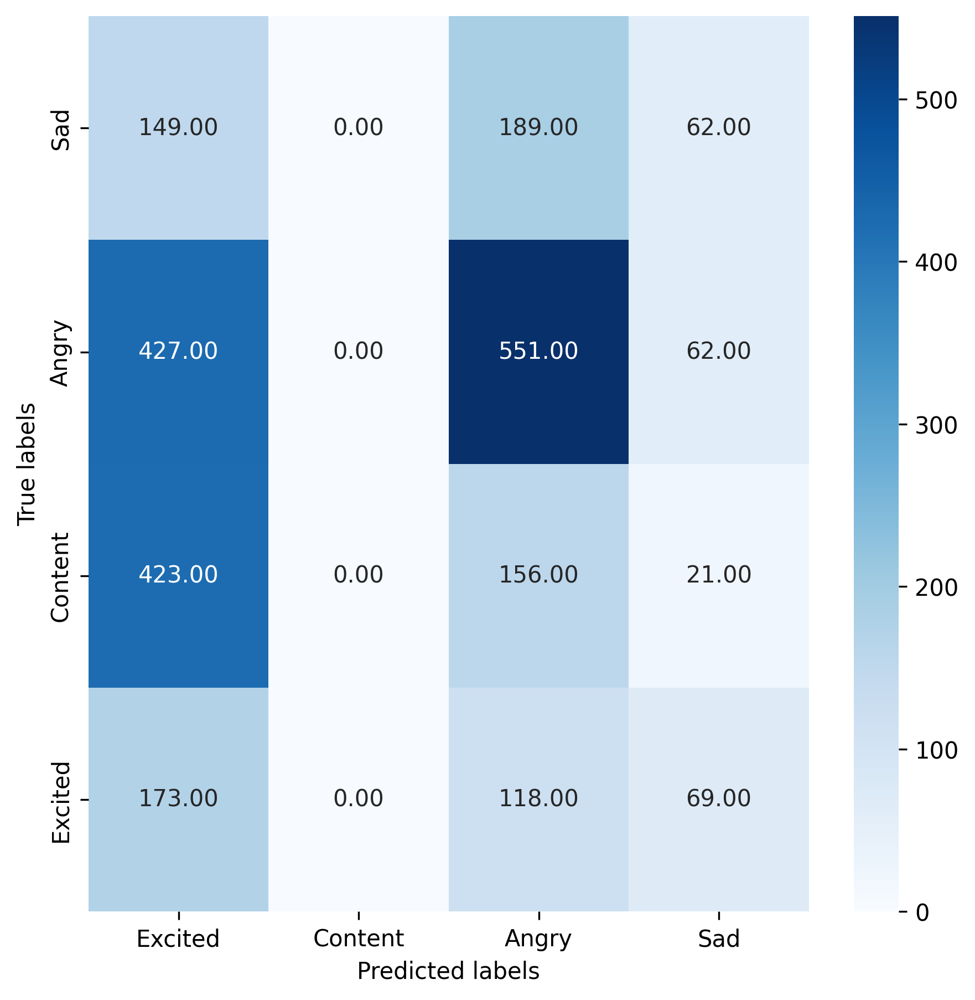

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.3046 - loss: 1.3955
Epoch 1: val_accuracy improved from -inf to 0.29750, saving model to model/subject_independent_model_best_within_t1_2.weights.h5
127/127 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - accuracy: 0.3048 - loss: 1.3953 - val_accuracy: 0.2975 - val_loss: 1.4624 - learning_rate: 0.0010
Epoch 2/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3777 - loss: 1.3040
Epoch 2: val_accuracy did not improve from 0.29750
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.3777 - loss: 1.3039 - val_accuracy: 0.2587 - val_loss: 1.4685 - learning_rate: 0.0010
Epoch 3/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3961 - loss: 1.2769
Epoch 3: val_accuracy improved from 0.29750 to 0.33625, saving model to model/subject_independent_model_best_within_t1_2.weights.h5
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.3962 - loss: 1.2768 - val_accuracy: 0.3363 - val_loss: 1.5892 - learning_rate: 0.0

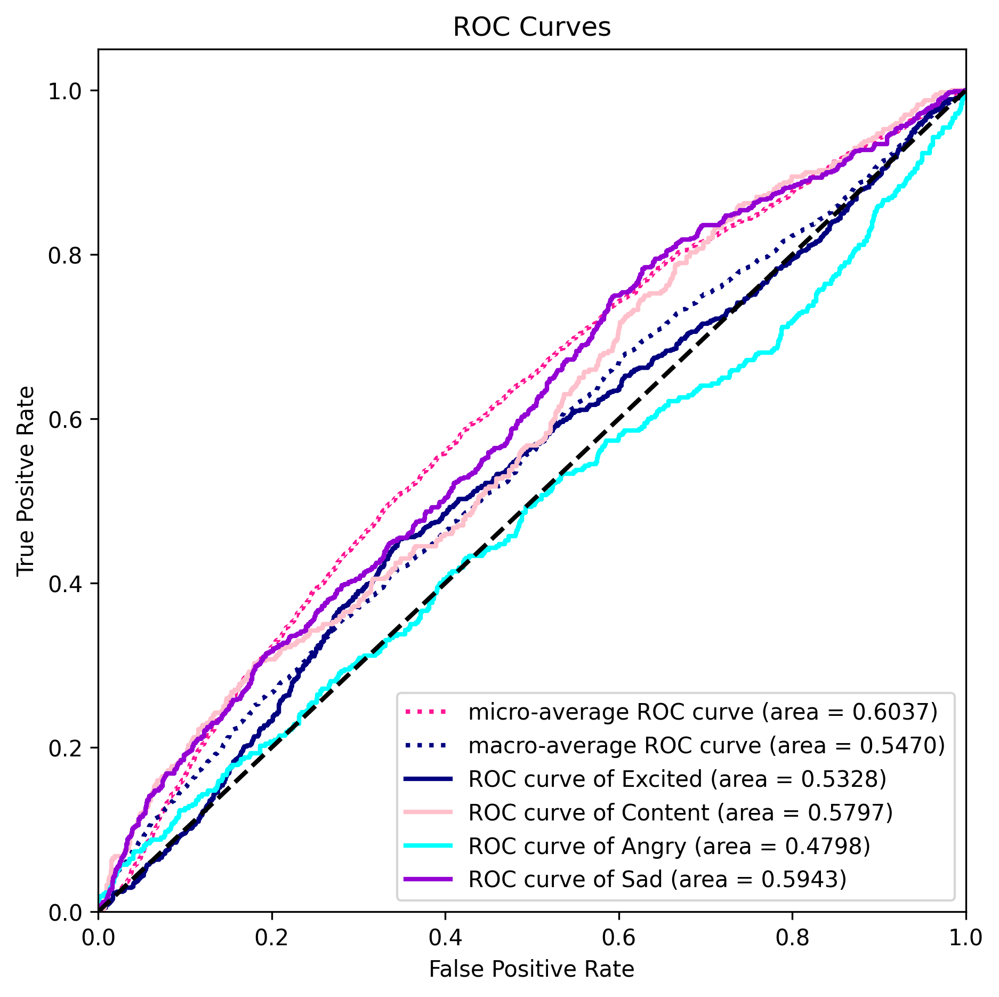

done


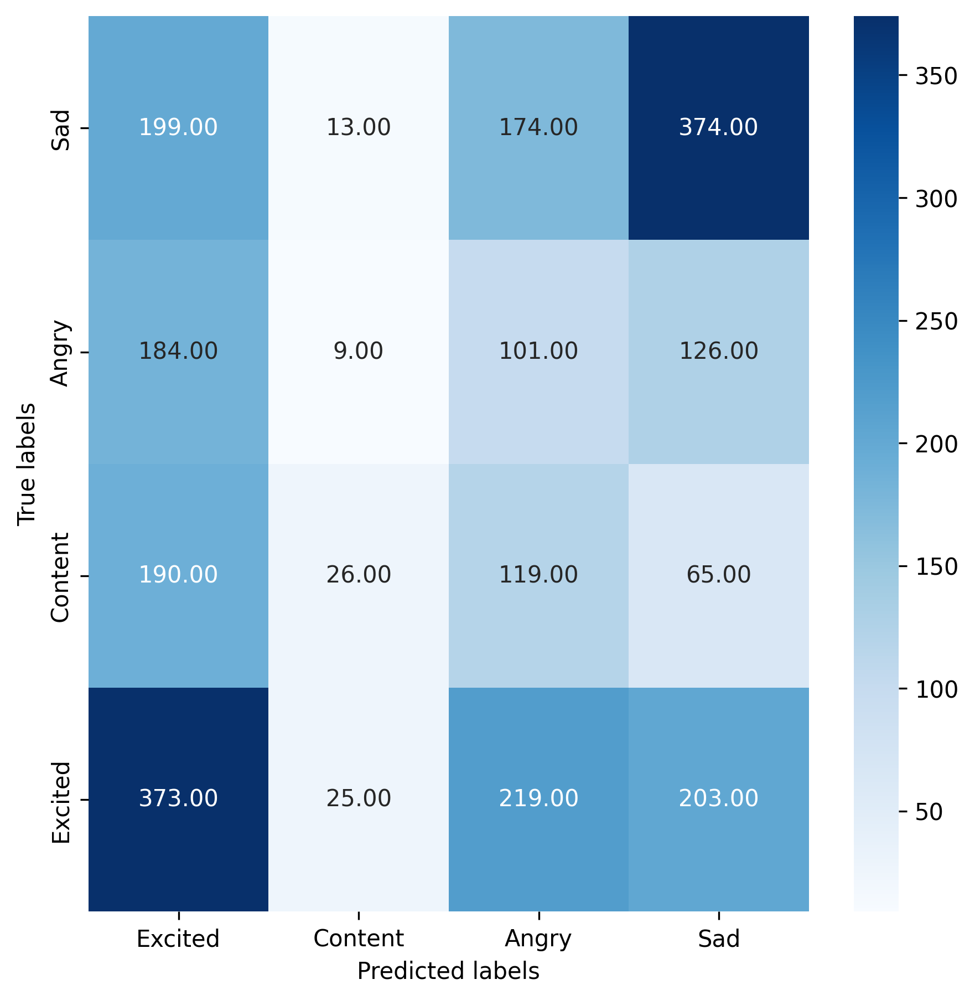

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.3122 - loss: 1.3992
Epoch 1: val_accuracy improved from -inf to 0.28458, saving model to model/subject_independent_model_best_within_t1_3.weights.h5
127/127 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - accuracy: 0.3124 - loss: 1.3989 - val_accuracy: 0.2846 - val_loss: 1.5696 - learning_rate: 0.0010
Epoch 2/200
126/127 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3930 - loss: 1.3044
Epoch 2: val_accuracy did not improve from 0.28458
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.3929 - loss: 1.3044 - val_accuracy: 0.2758 - val_loss: 1.8844 - learning_rate: 0.0010
Epoch 3/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3955 - loss: 1.2834
Epoch 3: val_accuracy did not improve from 0.28458
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.3955 - loss: 1.2833 - val_accuracy: 0.2700 - val_loss: 1.7583 - learning_rate: 0.0010
Epoch 4/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4127 - lo

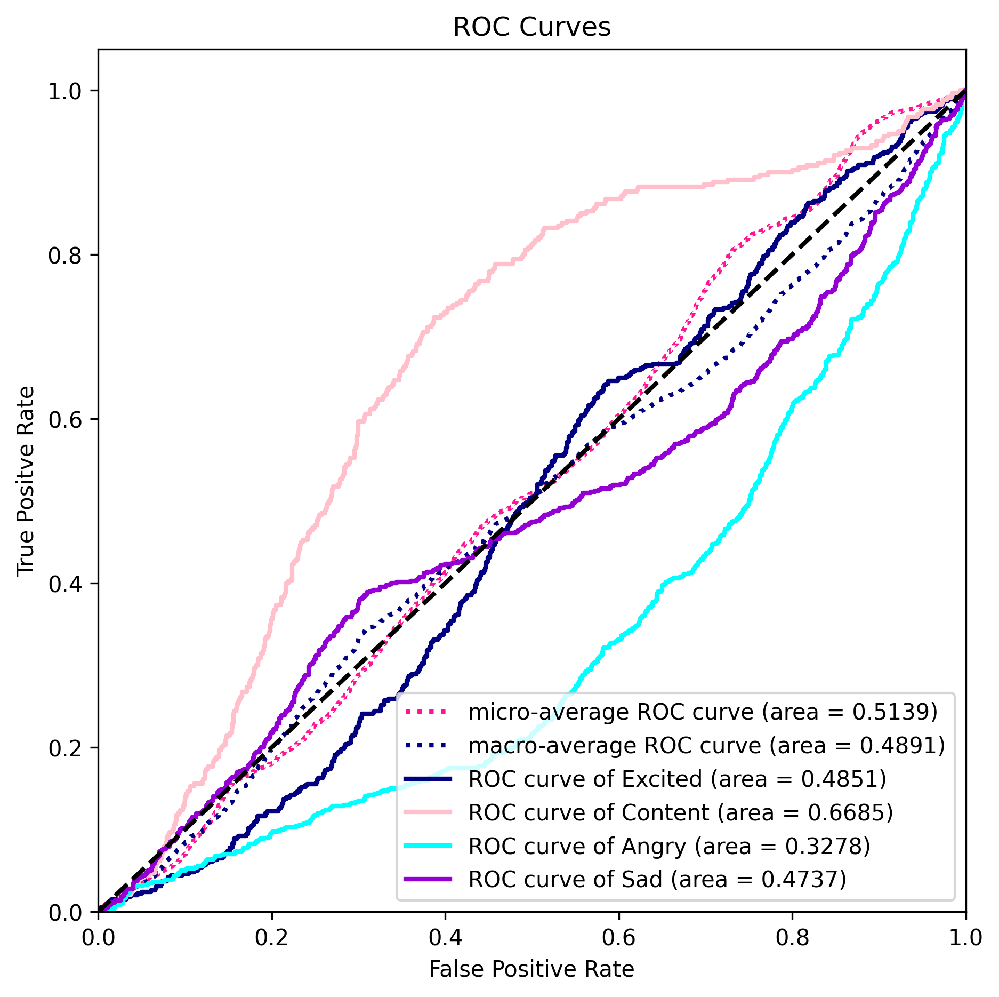

done


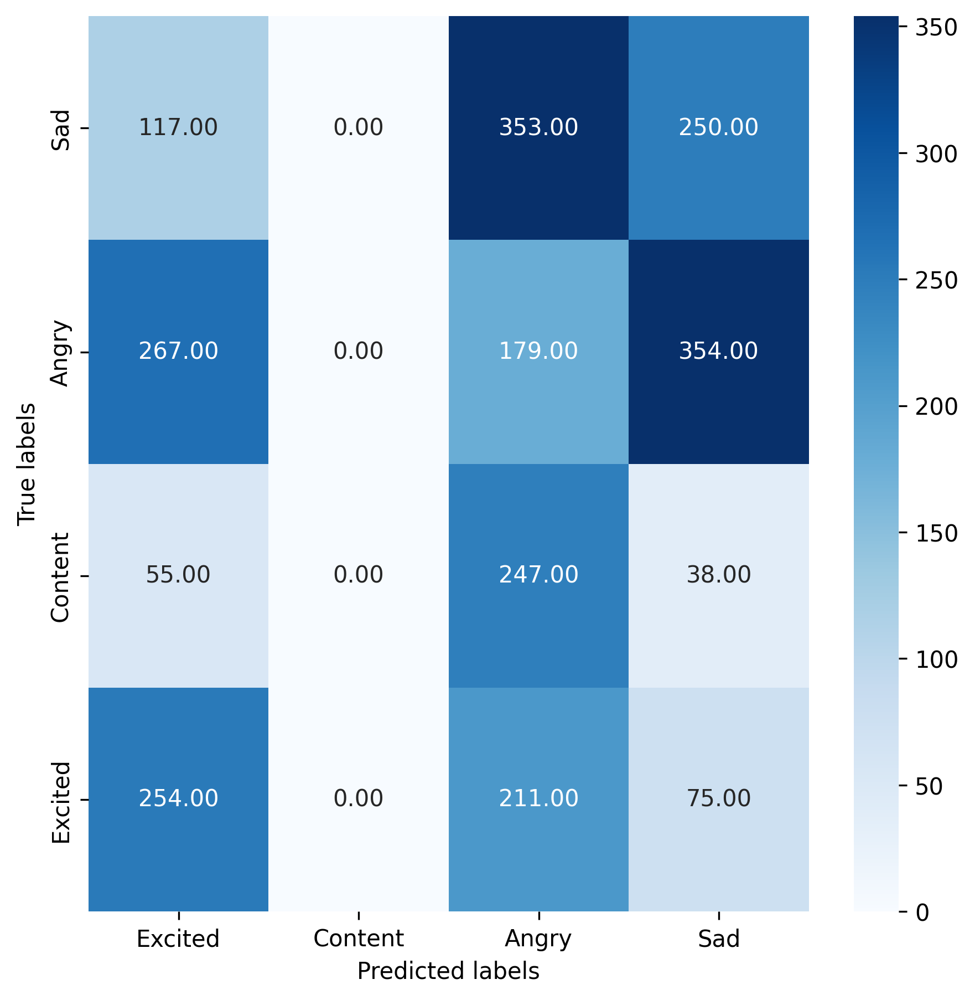

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.2969 - loss: 1.4305
Epoch 1: val_accuracy improved from -inf to 0.20500, saving model to model/subject_independent_model_best_within_t1_4.weights.h5
127/127 ━━━━━━━━━━━━━━━━━━━━ 23s 104ms/step - accuracy: 0.2972 - loss: 1.4300 - val_accuracy: 0.2050 - val_loss: 1.4424 - learning_rate: 0.0010
Epoch 2/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3870 - loss: 1.3027
Epoch 2: val_accuracy improved from 0.20500 to 0.24375, saving model to model/subject_independent_model_best_within_t1_4.weights.h5
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.3870 - loss: 1.3026 - val_accuracy: 0.2438 - val_loss: 1.4618 - learning_rate: 0.0010
Epoch 3/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.4019 - loss: 1.2750
Epoch 3: val_accuracy improved from 0.24375 to 0.26667, saving model to model/subject_independent_model_best_within_t1_4.weights.h5
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.4

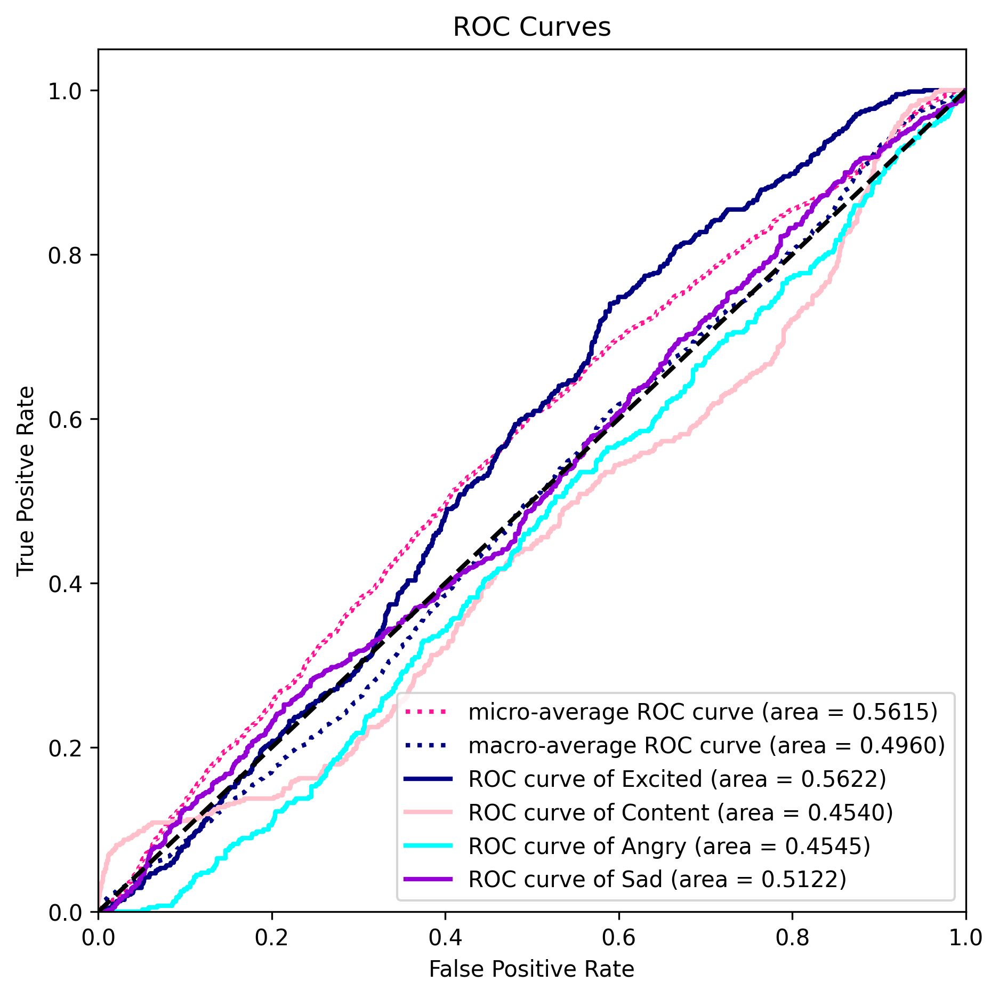

done


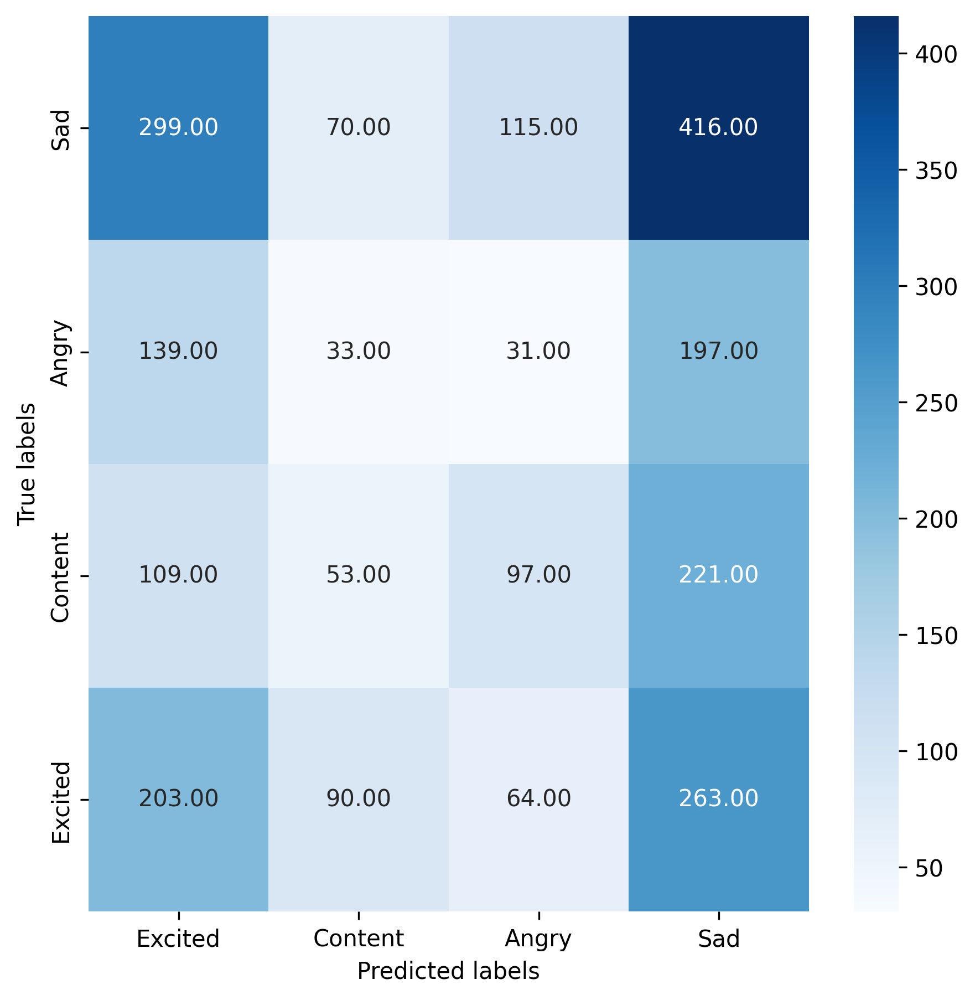

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.3162 - loss: 1.3867
Epoch 1: val_accuracy improved from -inf to 0.33083, saving model to model/subject_independent_model_best_within_t1_5.weights.h5
127/127 ━━━━━━━━━━━━━━━━━━━━ 23s 104ms/step - accuracy: 0.3164 - loss: 1.3865 - val_accuracy: 0.3308 - val_loss: 1.3859 - learning_rate: 0.0010
Epoch 2/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3782 - loss: 1.3099
Epoch 2: val_accuracy did not improve from 0.33083
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.3782 - loss: 1.3099 - val_accuracy: 0.1579 - val_loss: 1.4362 - learning_rate: 0.0010
Epoch 3/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3895 - loss: 1.2887
Epoch 3: val_accuracy did not improve from 0.33083
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.3894 - loss: 1.2887 - val_accuracy: 0.1546 - val_loss: 1.4248 - learning_rate: 0.0010
Epoch 4/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3985 - lo

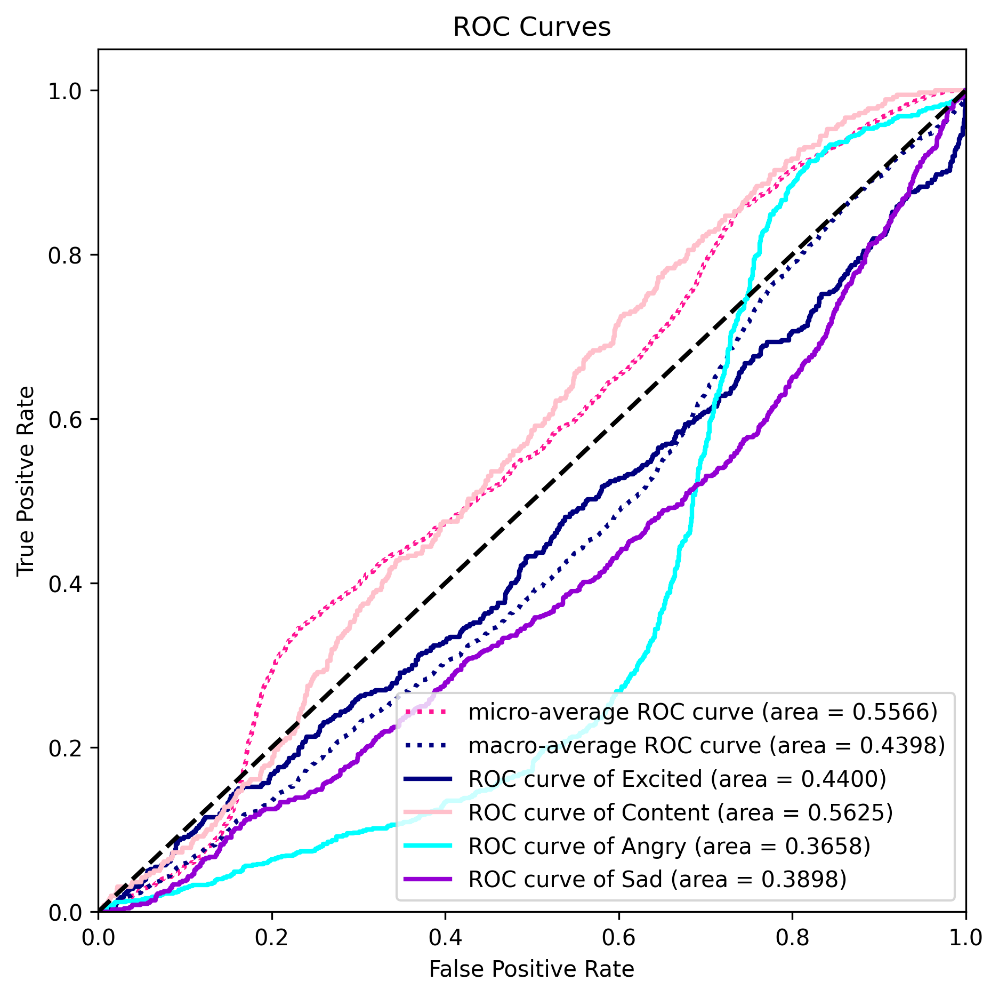

done


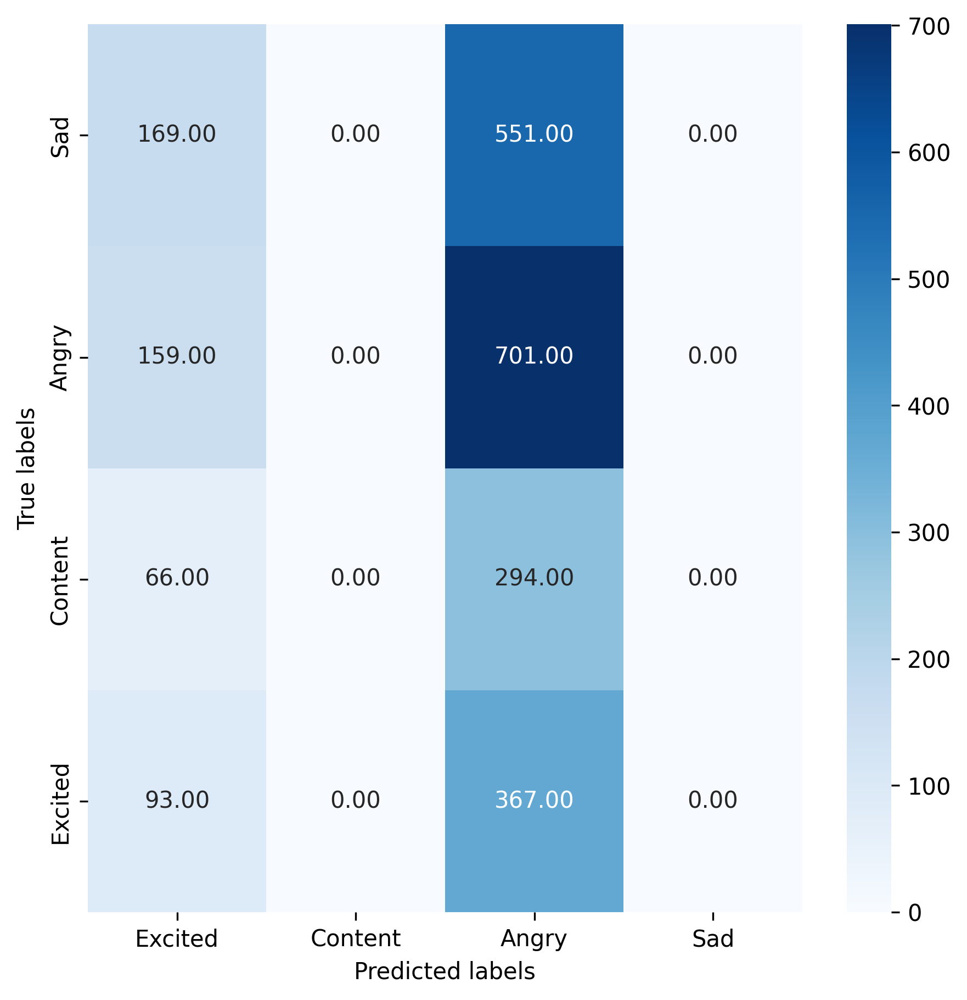

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.3175 - loss: 1.3900
Epoch 1: val_accuracy improved from -inf to 0.22000, saving model to model/subject_independent_model_best_within_t1_6.weights.h5
127/127 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - accuracy: 0.3178 - loss: 1.3897 - val_accuracy: 0.2200 - val_loss: 1.5007 - learning_rate: 0.0010
Epoch 2/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3730 - loss: 1.3092
Epoch 2: val_accuracy improved from 0.22000 to 0.28750, saving model to model/subject_independent_model_best_within_t1_6.weights.h5
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.3730 - loss: 1.3091 - val_accuracy: 0.2875 - val_loss: 1.5024 - learning_rate: 0.0010
Epoch 3/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.4087 - loss: 1.2727
Epoch 3: val_accuracy did not improve from 0.28750
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.4087 - loss: 1.2727 - val_accuracy: 0.2425 - val_loss: 1.6827 - learning_rate: 0.0

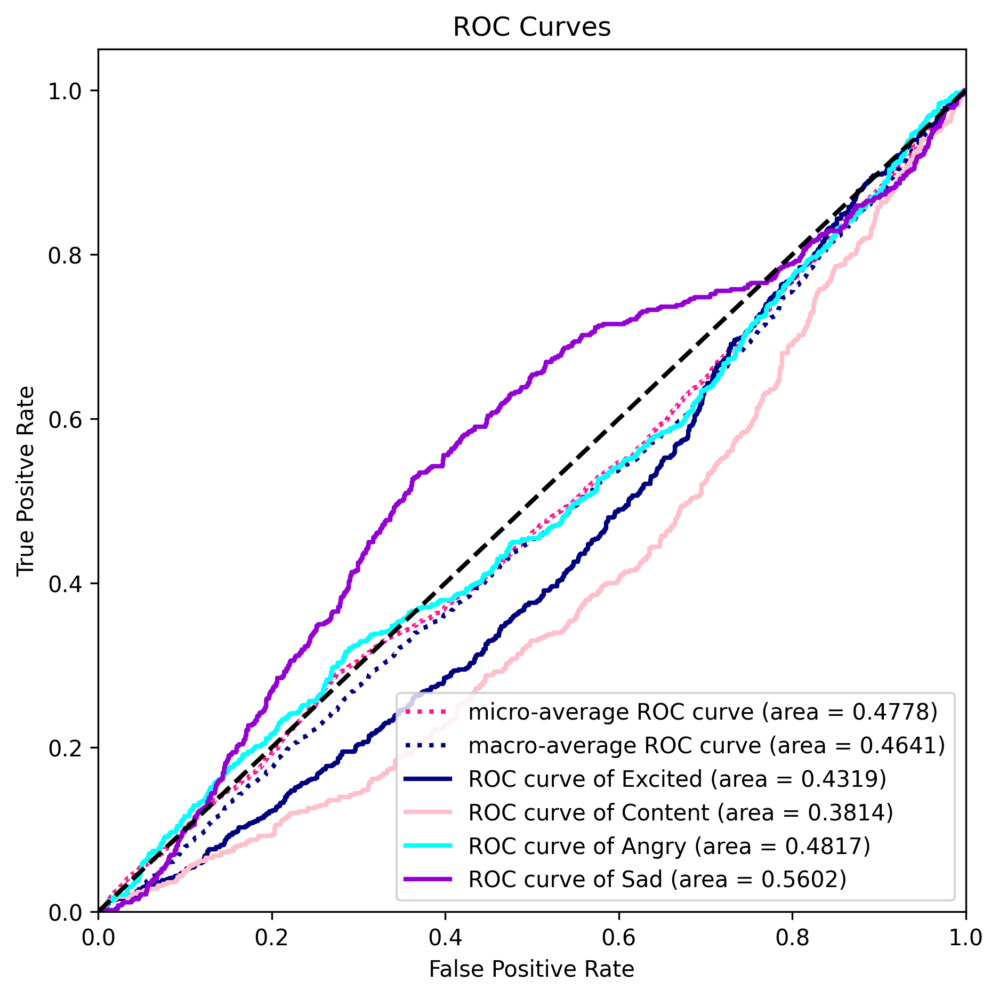

done


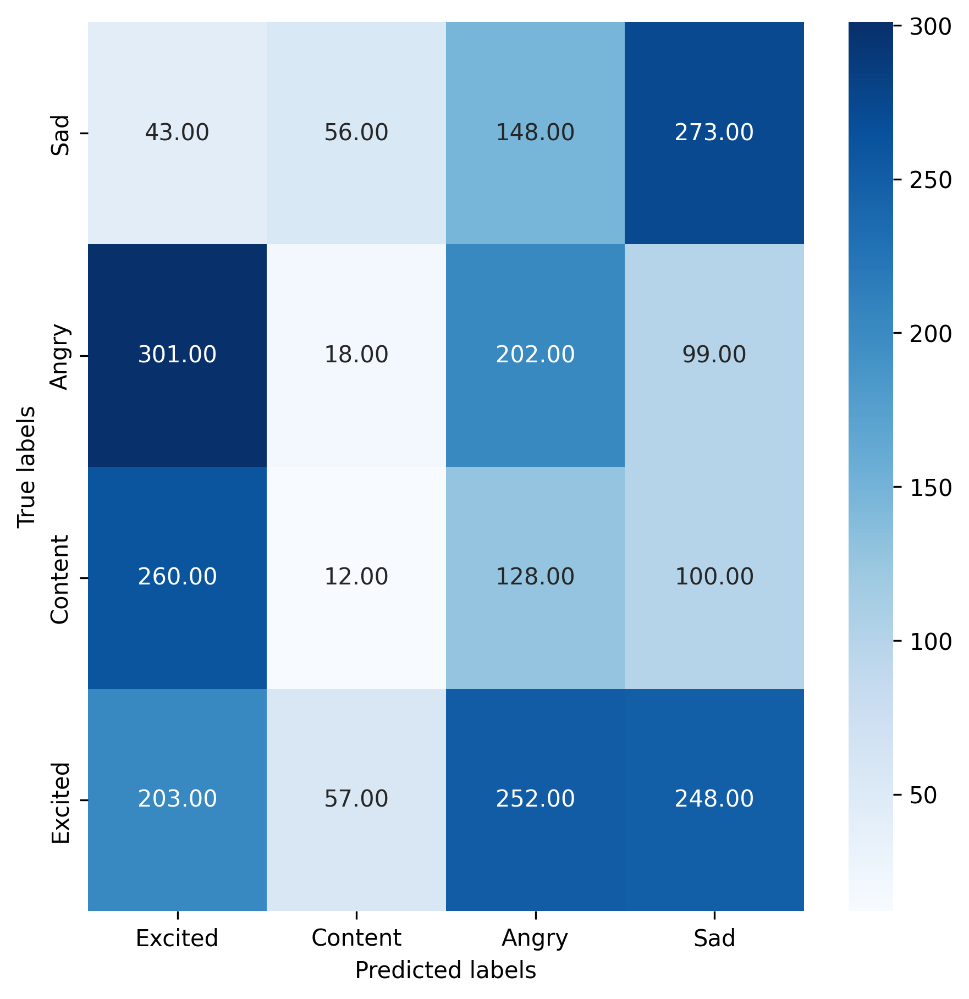

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.3013 - loss: 1.4194
Epoch 1: val_accuracy improved from -inf to 0.29458, saving model to model/subject_independent_model_best_within_t1_7.weights.h5
127/127 ━━━━━━━━━━━━━━━━━━━━ 23s 104ms/step - accuracy: 0.3015 - loss: 1.4190 - val_accuracy: 0.2946 - val_loss: 1.4589 - learning_rate: 0.0010
Epoch 2/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3855 - loss: 1.2971
Epoch 2: val_accuracy did not improve from 0.29458
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.3855 - loss: 1.2971 - val_accuracy: 0.2925 - val_loss: 1.4097 - learning_rate: 0.0010
Epoch 3/200
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4021 - loss: 1.2704
Epoch 3: val_accuracy improved from 0.29458 to 0.39792, saving model to model/subject_independent_model_best_within_t1_7.weights.h5
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.4021 - loss: 1.2704 - val_accuracy: 0.3979 - val_loss: 1.4082 - learning_rate: 0.0

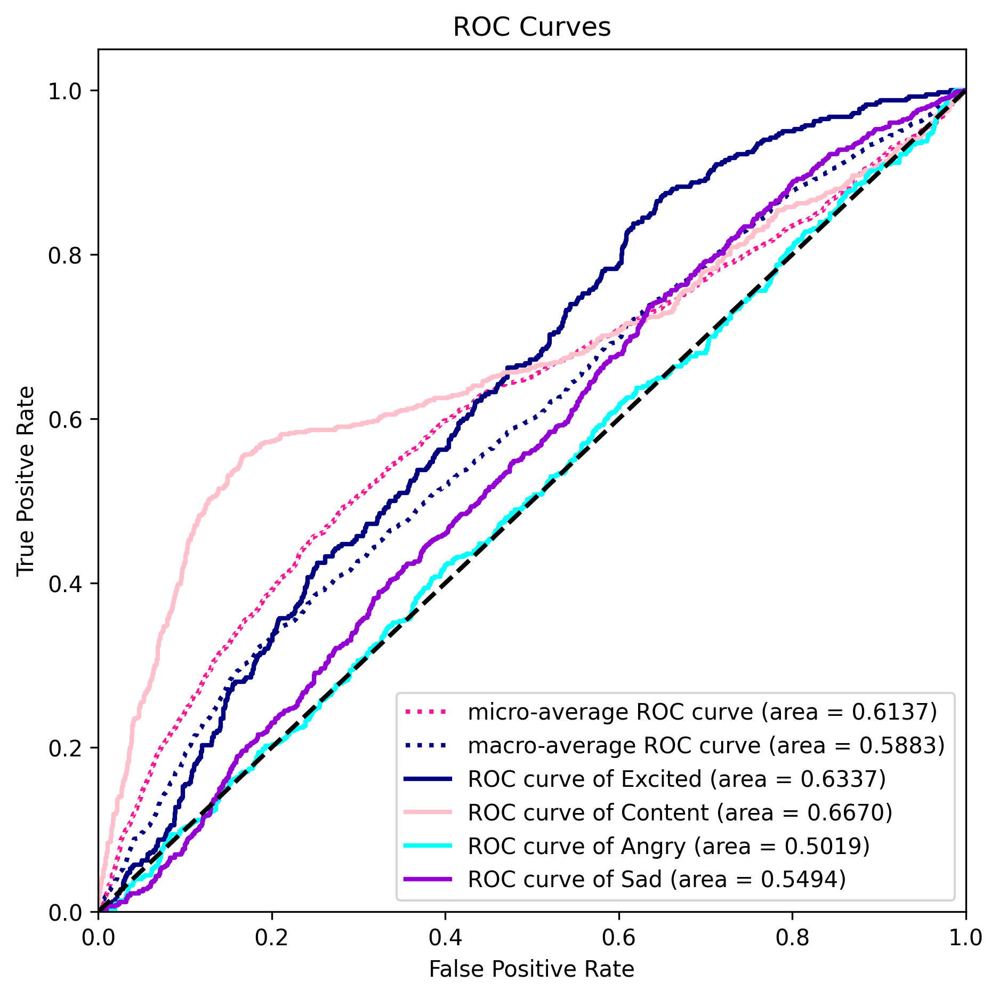

done


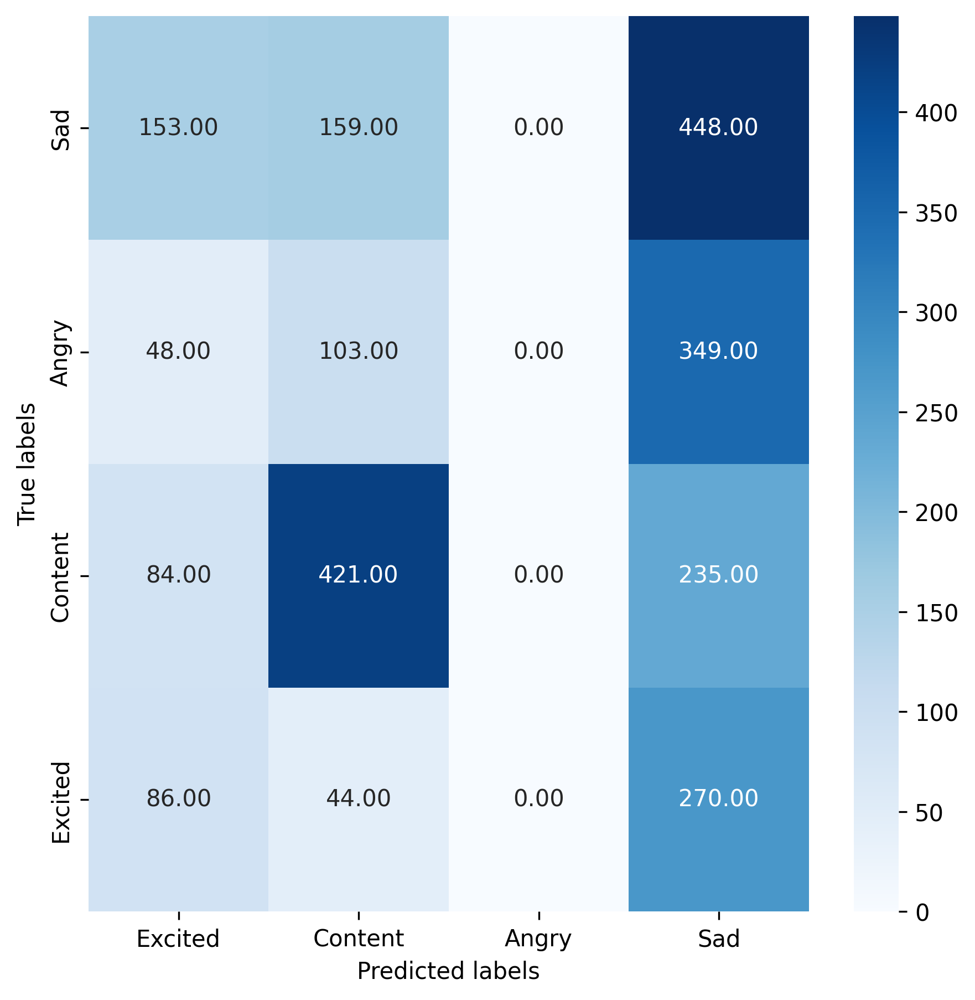

done


Model: "functional_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_21 (InputLayer)     │ (None, 32, 512, 1)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 32, 512, 8)     │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_63          │ (None, 32, 512, 8)     │            32 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ depthwise_conv2d_21             │ (None, 1, 512, 32)     │         1,024 │
│ (DepthwiseConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_64          │ (None, 1, 512, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_42 (Activation)      │ (None, 1, 512, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_21            │ (None, 1, 128, 32)     │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_84 (Dropout)            │ (None, 1, 128, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_21             │ (None, 1, 128, 32)     │         1,536 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_65          │ (None, 1, 128, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_43 (Activation)      │ (None, 1, 128, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_21 (Lambda)              │ (None, 128, 32)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ learnable_positional_encoding_… │ (None, 128, 32)        │        16,000 │
│ (LearnablePositionalEncoding)   │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ transformer_block_21            │ (None, 128, 32)        │        34,720 │
│ (TransformerBlock)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_21     │ (None, 32)             │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_87 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 4)              │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ softmax (Activation)            │ (None, 4)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 162,338 (634.14 KB)

 Trainable params: 54,064 (211.19 KB)

 Non-trainable params: 144 (576.00 B)

 Optimizer params: 108,130 (422.39 KB)

[0.28458333333333335, 0.3275, 0.3641666666666667, 0.28458333333333335, 0.29291666666666666, 0.3308333333333333, 0.2875, 0.39791666666666664]
Accuracy: 32.12% (+/- 3.95%)
ERTNet Train End.


In [16]:
import logging
ertnet_logger = logging.getLogger('ertnet_logger')
ertnet_logger.setLevel(logging.INFO)
os.makedirs('logs', exist_ok=True)
os.makedirs('model', exist_ok=True)
os.makedirs('picture', exist_ok=True)
file_handler = logging.FileHandler('logs/ertnet.log')
ertnet_logger.addHandler(file_handler)

import numpy as np
from tensorflow import keras
from tensorflow.keras.utils import to_categorical

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []
class Model_Config_DEAP:
    K = 10

    nb_classes=4
    Chans=32
    Samples=512
    dropoutRate=0.5
    kernLength=64
    F1=8
    D=4
    F2=32
    dropoutType='Dropout'

    es_patience=50
    batch_size = 128
    max_epochs = 200
    lr_begin = 1e-3
    lr_end = 1e-5
    re_lr_patience = 10
    re_lr_factor = 0.1
params = Model_Config_DEAP
i = 0

curr_files = []
for filename in os.listdir(preprocessed_folder):
    if filename.endswith('.dat') and len(curr_files)<3:
        curr_files.append(filename)
    elif filename.endswith('.dat'):
        train_data, train_labels, test_data, test_labels, val_data, val_labels = losocv_data_split(curr_files)
        curr_files = []
        early_stop = EarlyStopping(monitor='val_loss', patience=params.es_patience, verbose=1)
        # Set model checkpoint callback
        checkpoint = ModelCheckpoint(filepath=f'model/subject_independent_model_best_within_t1_{i}.weights.h5',
                                     monitor='val_accuracy',
                                     verbose=1, save_best_only=True, mode='max', save_weights_only=True)
        # Load model
        model = ertnet(nb_classes=params.nb_classes, Chans=params.Chans,
                        Samples=params.Samples, dropoutRate=params.dropoutRate,
                        kernLength=params.kernLength, F1=params.F1, D=params.D,
                        F2=params.F2)
        # Use tf.keras.optimizers.Adam instead of keras.optimizers.adam_v2.Adam
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=params.lr_begin),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
        # Set reduce learning rate callback
        reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=params.re_lr_factor,
                                      patience=params.re_lr_patience, mode='auto',
                                      min_lr=params.lr_end)
        # Fit model
        hist = model.fit(train_data, train_labels, epochs=params.max_epochs,
                         batch_size=params.batch_size,
                         validation_data=(test_data,test_labels),
                         callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()])
        # Get the best accuracy on the validation set
    
        model_best = ertnet(nb_classes=params.nb_classes, Chans=params.Chans,
                            Samples=params.Samples, dropoutRate=params.dropoutRate,
                            kernLength=params.kernLength, F1=params.F1, D=params.D,
                            F2=params.F2)
        model_best.load_weights(f'model/subject_independent_model_best_within_t1_{i}.weights.h5')
        pred = model_best.predict(test_data)
    
        correct_predictions = np.sum(np.argmax(test_labels, axis=1) == np.argmax(pred, axis=1))
        print("Accuracy in exclusive test data: " ,correct_predictions/test_labels.shape[0])
        cv_scores.append(correct_predictions/test_labels.shape[0])
        # Plot ROC curve
        plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'],
                          colorlist=['navy', 'pink', 'cyan', 'darkviolet'],
                          file=f'picture/roc_within_t1_{i}.jpg',dpi=300)
        # Plot confusion matrix
        plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                             ClassSet=['Excited', 'Content', 'Angry', 'Sad'],
                             file=f'picture/hm_within_t1_{i}.jpg',dpi=300)
        ertnet_logger.info(f"{i} Fold Training Epochs Accuracy on test data: {correct_predictions/test_labels.shape[0]}")
        i = i + 1
# Print model summary
model.summary()
# Save information to log file
print(cv_scores)
ertnet_logger.info(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
ertnet_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('ERTNet Train End.')

## CLstm

In [ ]:
import logging
cl_logger = logging.getLogger('cl_logger')
cl_logger.setLevel(logging.INFO)
os.makedirs('logs', exist_ok=True)
os.makedirs('model', exist_ok=True)
os.makedirs('picture', exist_ok=True)
file_handler = logging.FileHandler('logs/cl.log')
cl_logger.addHandler(file_handler)

import numpy as np
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []
for filename in os.listdir(preprocessed_folder):
    if filename.endswith('.dat'):
        train_data, train_labels, test_data, test_labels = losocv_data_split(filename)

    early_stop = EarlyStopping(monitor='val_loss', patience=50, verbose=1)
    checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_cl.weights.h5', 
                                monitor='val_accuracy', verbose=1, save_best_only=True, 
                                mode='max', save_weights_only=True)

    model = CNN_BiLSTM(4, Chans = 32, Samples = 512, F1=8, D=4, F2=32)
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
                loss='categorical_crossentropy',
                metrics=['accuracy'])

    reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=10,mode='auto',min_lr=1e-5)

    hist = model.fit(train_data, train_labels, epochs=200,
                    batch_size=128,
                    validation_data=(test_data, test_labels),
                    callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()])

    pred = model.predict(test_data)
    correct_predictions = np.sum(np.argmax(test_labels, axis=1) == np.argmax(pred, axis=1))
    print("Accuracy in exclusive test data: " ,correct_predictions/test_labels.shape[0])
    cv_scores.append(correct_predictions/test_labels.shape[0])

    plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'], 
                    colorlist=['navy', 'pink', 'cyan', 'darkviolet'], 
                    file=f'picture/roc_within_cl.jpg',dpi=600)

    plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                        ClassSet=['Excited', 'Content', 'Angry', 'Sad'], 
                        file=f'picture/hm_within_cl.jpg',dpi=600)
    cl_logger.info(f"Training Epochs Accuracy: {correct_predictions/test_labels.shape[0]}")

model.summary()

print(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
cl_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('cl Train End.')


## DEEPCONVNET

In [ ]:
import logging
deepconvnet_logger = logging.getLogger('deepconvnet_logger')
deepconvnet_logger.setLevel(logging.INFO)
file_handler = logging.FileHandler('logs/deepconvnet.log')
deepconvnet_logger.addHandler(file_handler)

import numpy as np
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []

for filename in os.listdir(preprocessed_folder):
    if filename.endswith('.dat'):
        train_data, train_labels, test_data, test_labels = losocv_data_split(filename)
    early_stop = EarlyStopping(monitor='val_loss', patience=50, verbose=1)

    checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_deepconvnet.weights.h5', 
                                monitor='val_accuracy', verbose=1, save_best_only=True, 
                                mode='max', save_weights_only=True)

    model = DeepConvNet(nb_classes=4, Chans = 32, Samples = 512, dropoutRate = 0.5)
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
                loss='categorical_crossentropy',
                metrics=['accuracy'])

    reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=10,mode='auto',min_lr=1e-5)

    hist = model.fit(train_data, train_labels, epochs=200,
                    batch_size=128,
                    validation_data=(test_data, test_labels),
                    callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()])

    model_best = DeepConvNet(nb_classes=4, Chans = 32, Samples = 512, dropoutRate = 0.5)
    model_best.load_weights(f'model/model_best_within_deepconvnet.weights.h5')

    pred = model_best.predict(test_data)
    correct_predictions = np.sum(np.argmax(test_labels, axis=1) == np.argmax(pred, axis=1))
    print("Accuracy in exclusive test data: " ,correct_predictions/test_labels.shape[0])
    cv_scores.append(correct_predictions/test_labels.shape[0])

    plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'], 
                    colorlist=['navy', 'pink', 'cyan', 'darkviolet'], 
                    file=f'picture/roc_within_deepconvnet.jpg',dpi=300)

    plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                        ClassSet=['Excited', 'Content', 'Angry', 'Sad'], 
                        file=f'picture/hm_within_deepconvnet.jpg',dpi=300)
    deepconvnet_logger.info(f"Training Epochs Accuracy: {correct_predictions/test_labels.shape[0]}")

model.summary()

print(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
deepconvnet_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('deepconvnet Train End.')


## EEGNET

In [ ]:
import logging
eegnet_logger = logging.getLogger('eegnet_logger')
eegnet_logger.setLevel(logging.INFO)
file_handler = logging.FileHandler('logs/eegnet.log')
eegnet_logger.addHandler(file_handler)

import numpy as np
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []


for filename in os.listdir(preprocessed_folder):
    if filename.endswith('.dat'):
        train_data, train_labels, test_data, test_labels = losocv_data_split(filename)

    early_stop = EarlyStopping(monitor='val_loss', patience=50, verbose=1)
    checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_eegnet.weights.h5', 
                                monitor='val_accuracy', verbose=1, save_best_only=True, 
                                mode='max', save_weights_only=True)

    model = EEGNet(nb_classes=4, Chans=32, Samples=512, dropoutRate=0.5, kernLength=64, F1=8, D=4, F2=32)
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
                loss='categorical_crossentropy',
                metrics=['accuracy'])

    reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=10,mode='auto',min_lr=1e-5)

    hist = model.fit(train_data, train_labels, epochs=200,
                    batch_size=128,
                    validation_data=(test_data, test_labels),
                    callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()], verbose=0)


    model_best = EEGNet(nb_classes=4, Chans=32, Samples=512, dropoutRate=0.5, kernLength=64, F1=8, D=4, F2=32)
    model_best.load_weights(f'model/model_best_within_eegnet.weights.h5')
    pred = model_best.predict(test_data)

    correct_predictions = np.sum(np.argmax(test_labels, axis=1) == np.argmax(pred, axis=1))
    print("Accuracy in exclusive test data: " ,correct_predictions/test_labels.shape[0])
    cv_scores.append(correct_predictions/test_labels.shape[0])

    plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'], 
                    colorlist=['navy', 'pink', 'cyan', 'darkviolet'], 
                    file=f'picture/roc_within_eegnet.jpg',dpi=300)

    plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                        ClassSet=['Excited', 'Content', 'Angry', 'Sad'], 
                        file=f'picture/hm_within_eegnet.jpg',dpi=300)
    eegnet_logger.info(f"Training Epochs Accuracy: {correct_predictions/test_labels.shape[0]}")

model.summary()

print(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
eegnet_logger.info(cv_scores)
eegnet_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('EEGNet Train End.')


## SHOLLOWCONVNET

In [ ]:
import logging
shallowconvnet_logger = logging.getLogger('shallowconvnet_logger')
shallowconvnet_logger.setLevel(logging.INFO)
file_handler = logging.FileHandler('logs/shallowconvnet.log')
shallowconvnet_logger.addHandler(file_handler)

import numpy as np
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []

for filename in os.listdir(preprocessed_folder):
    if filename.endswith('.dat'):
        train_data, train_labels, test_data, test_labels = losocv_data_split(filename)

    early_stop = EarlyStopping(monitor='val_loss', patience=50, verbose=1)
    checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_shallowconvnet.weights.h5', 
                                monitor='val_accuracy', verbose=1, save_best_only=True, 
                                mode='max', save_weights_only=True)

    model = ShallowConvNet(nb_classes=4, Chans = 32, Samples = 512, dropoutRate = 0.5)
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
                loss='categorical_crossentropy',
                metrics=['accuracy'])

    reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=10,mode='auto',min_lr=1e-5)

    hist = model.fit(train_data, train_labels, epochs=200,
                    batch_size=128,
                    validation_data=(test_data, test_labels),
                    callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()])


    model_best = ShallowConvNet(nb_classes=4, Chans = 32, Samples = 512, dropoutRate = 0.5)
    model_best.load_weights(f'model/model_best_within_shallowconvnet.weights.h5')

    pred = model_best.predict(test_data)

    correct_predictions = np.sum(np.argmax(test_labels, axis=1) == np.argmax(pred, axis=1))
    print("Accuracy in exclusive test data: " ,correct_predictions/test_labels.shape[0])
    cv_scores.append(correct_predictions/test_labels.shape[0])

    plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'], 
                    colorlist=['navy', 'pink', 'cyan', 'darkviolet'], 
                    file=f'picture/roc_within_shallowconvnet.jpg',dpi=300)

    plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                        ClassSet=['Excited', 'Content', 'Angry', 'Sad'], 
                        file=f'picture/hm_within_shallowconvnet.jpg',dpi=300)
    shallowconvnet_logger.info(f"Training Epochs Accuracy: {correct_predictions/test_labels.shape[0]}")


model.summary()

print(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
shallowconvnet_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('shallowconvnet Train End.')


# END












